# Examples for NNSC 

This notebook requires Jupyter Notebook to be run and describes the NNSC code and shows some examples of its performance 

The main executable is found in the root directory of the repository and its called nnsc.py: 

In [1]:
cd ..

/Users/arnau/Documents/physics/codes/nnsc


In [2]:
ls

LICENSE    config/    nnsc/      notebooks/
README.md  data/      nnsc.py    output/


As described in the README.md, the other directories contain:

- config: input configuration files that specify input and output paths and names, as well as the implementation parameters.

- data: toy data to run examples, more details found in data/data_readme.md

- nnsc: modules with all the methods to run NNSC.

- notebooks: here we are now :)

- output: where the output is saved (if so)

In order to interactively see the results in the notebook we import matplotlib, but nnsc already imports it, so that it is not necessary to do it when running it in a Python shell. 

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

To run the code with the default parameterization, we just need to run: 


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.931567  |    0   |
|     0.922759  |    1   |
|     0.913625  |    2   |
|     0.904714  |    3   |
|     0.896042  |    4   |
|     0.887245  |    5   |
|     0.877570  |    6   |
|     0.865629  |    7   |
|     0.853781  |    8   |
|     0.843014  |    9   |
|     0.833089  |    10   |
|     0.823932  |    11   |
|     0.815486  |    12   |
|     0.807721  |    13   |
|     0.800632  |    14   |
|     0.794292  |    15   |
|     0.788659  |    16   |
|     0.783679  |    17   |
|     0.779305  |    18   |
|     0.775481  |    19   |
|     0.772160  |    20   |
|     0.769235  |    21   |
|     0.761360  |    22   |
|     0.720502 

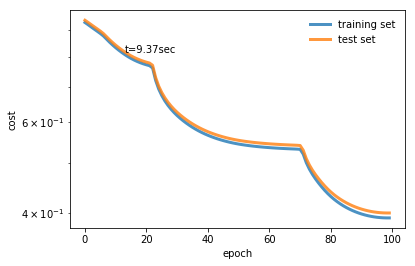

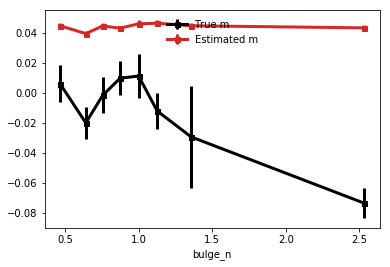

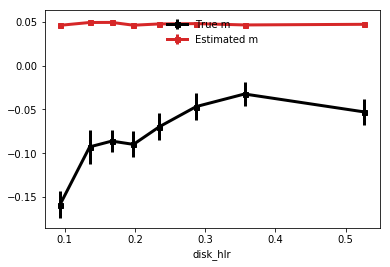

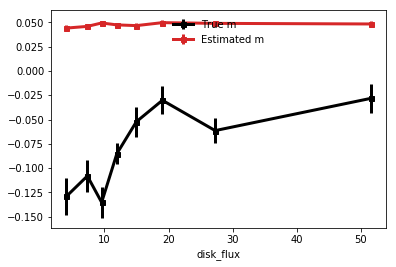

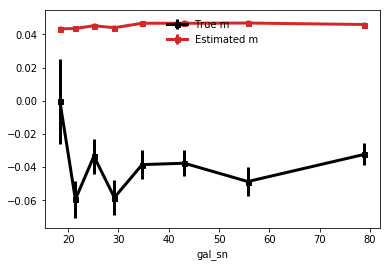

...

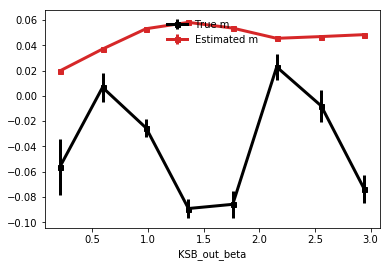

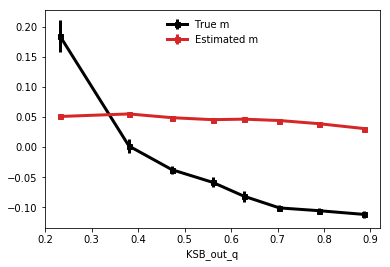

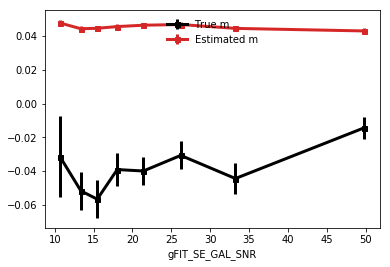

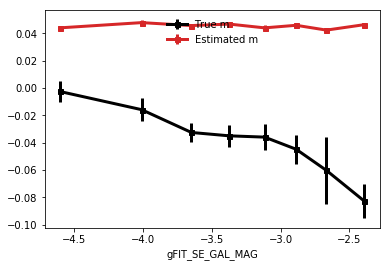

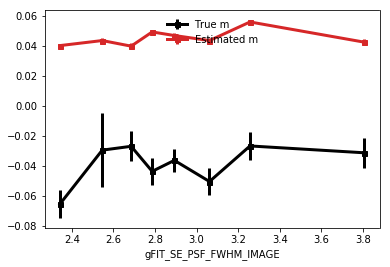

calculating gFIT_final_e1 gFIT_final_e2


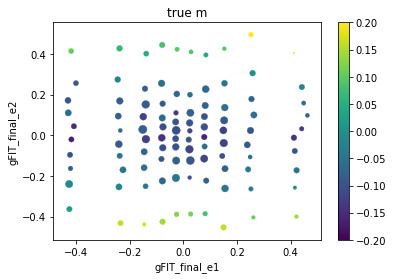

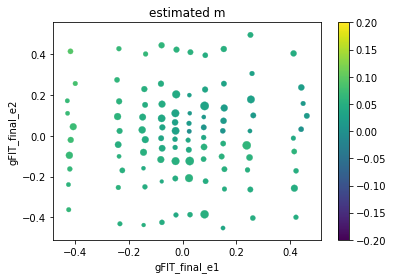

Chi^2 = 0.01577562628584548


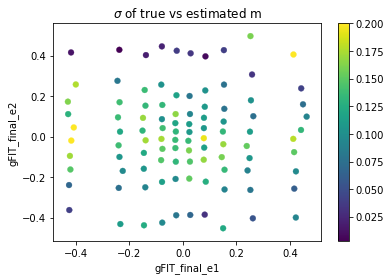

calculating KSB_final_e1 KSB_final_e2


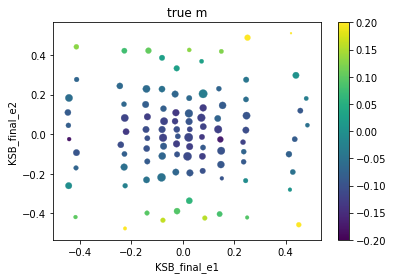

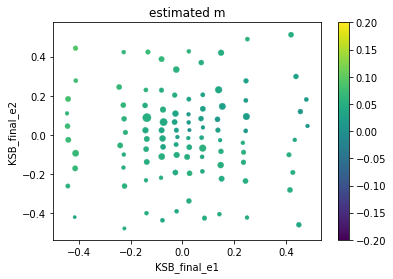

Chi^2 = 0.018305035043282354


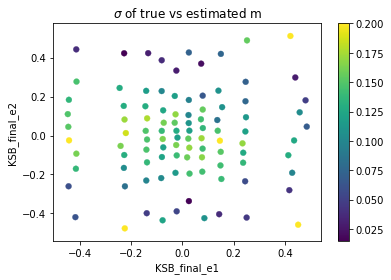

calculating g1_intrinsic g2_intrinsic


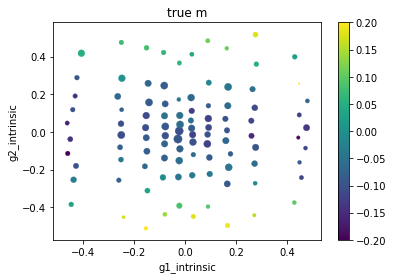

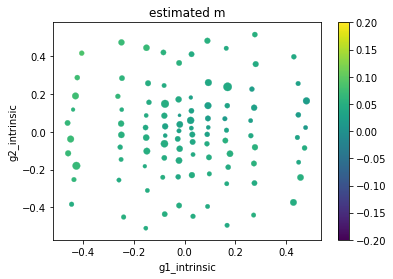

Chi^2 = 0.015340984074590457


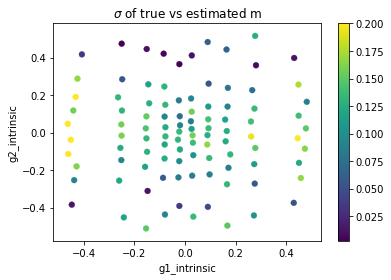

calculating gFIT_out_beta gFIT_out_q


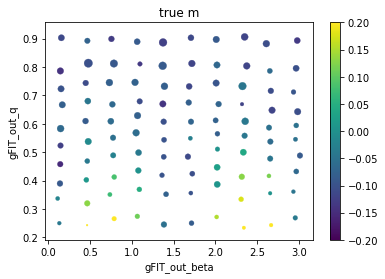

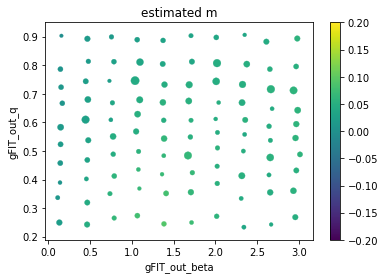

Chi^2 = 0.018833152914334423


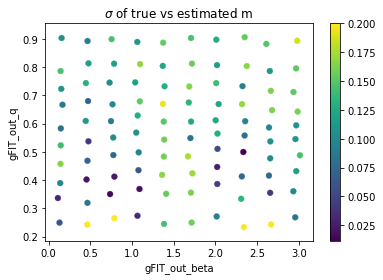

calculating KSB_out_beta KSB_out_q


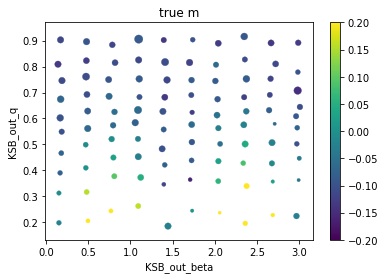

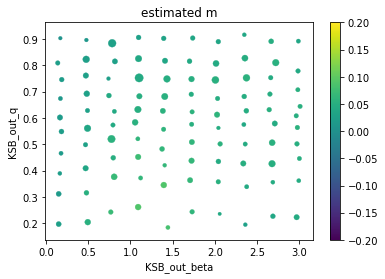

Chi^2 = 0.019026573793794015


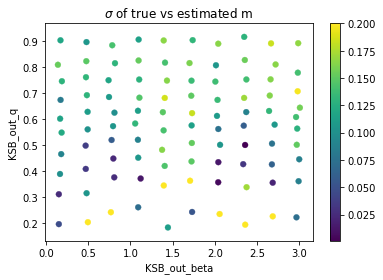

calculating in_beta in_q


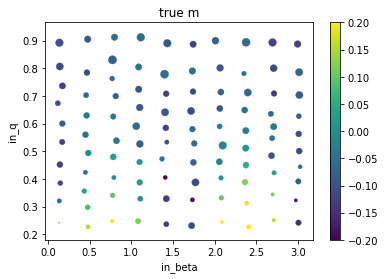

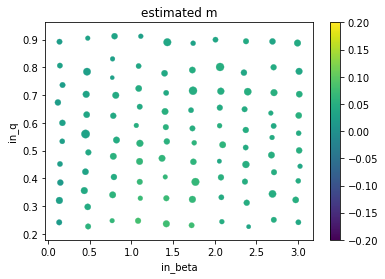

Chi^2 = 0.016986659062820885


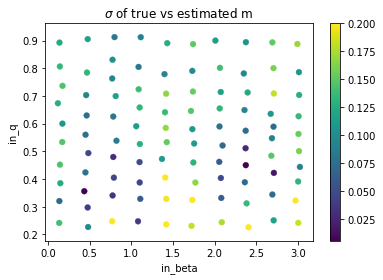

calculating bulge_hlr disk_hlr


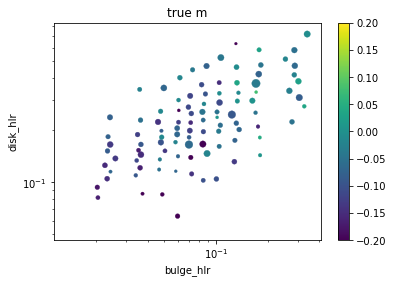

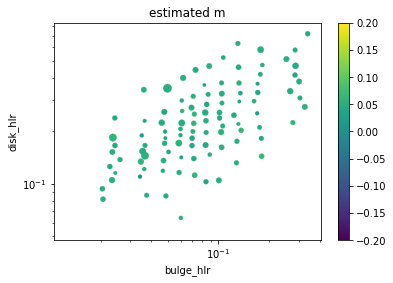

Chi^2 = 0.020725337317176056


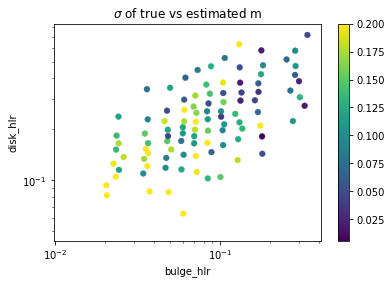

calculating bulge_flux disk_flux


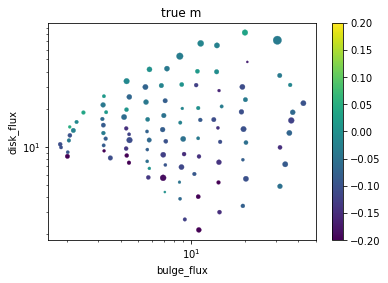

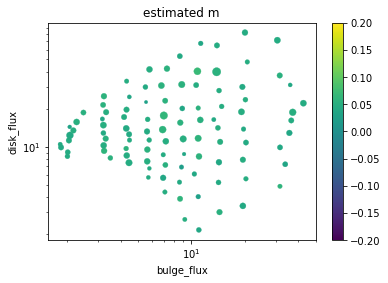

Chi^2 = 0.01941987902113046


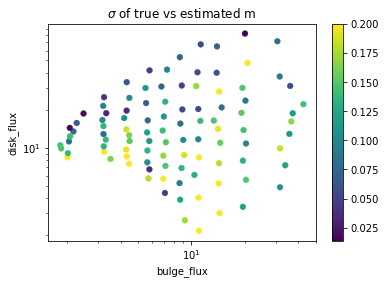

calculating KSB_out_sn gFIT_out_flux


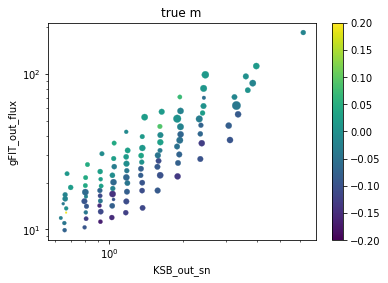

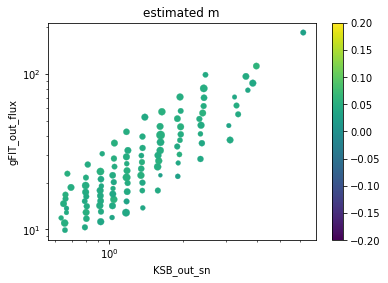

Chi^2 = 0.010355676559128557


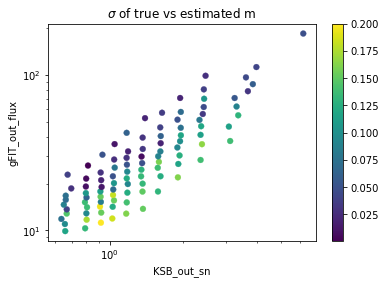

calculating bulge_hlr bulge_n


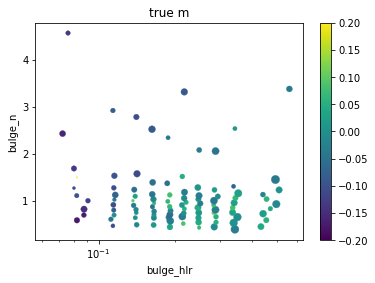

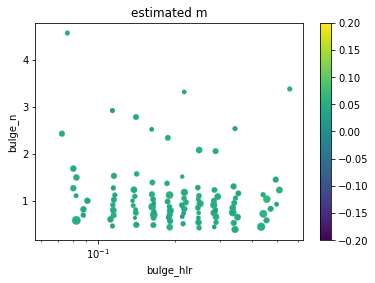

Chi^2 = 0.008088578858541208


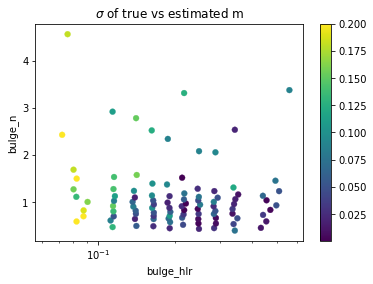

In [4]:
run nnsc.py

We see that two columns are shown, showing the cost (left) in each epoch (right) of the minimization process. 

Then, a nice Wall-e shows the time taken for the learning, and a plot of the evolution of the cost function for the test and training is shown. 

After, a series of plots are shown comparing the true with the estimated shear bias m as a function of different properties. 

Finally, a series of plots are shown:

- True bias (colour coded) as a function of two properties.

- Estimated bias (colour coded) as a function of the same properties.

- Estimation error (square difference between true and estimated) of bias as a function of the same properties.

This is repeated for several paris of properties for the x- and y-axis.

The set of plots shown depends on the input properties used for the training (specified in params['selection']).

### Parameterization 

We have two ways to run other parameterizations: 

- By modifying the parameter file config/param.

- By running nnsc.py with arguments as:
        
        run nnsc.py par_name1 par_val1 par_name2 par_val2 … par_nameN par_valN
        
  where par_nameX specifies the names of the parameter we want to define and par_valX corresponds to the value that we want to give to the parameter.

### Examples 

Here we run nnsc using only 1000 objects for the training and test sets, we use only 100 epochs for the training, a batch size of 128, a learning rate of 0.002, we do not show the results and we do not save them either:


In [4]:
run nnsc.py n_train 1000 n_test 1000 n_epochs 20 batch_size 128 learning_rate 0.002 show False save False


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.089299  |    0   |
|     0.051884  |    1   |
|     0.041317  |    2   |
|     0.027674  |    3   |
|     0.026369  |    4   |
|     0.024840  |    5   |
|     0.023051  |    6   |
|     0.023246  |    7   |
|     0.022855  |    8   |
|     0.022669  |    9   |
|     0.022624  |    10   |
|     0.022579  |    11   |
|     0.022530  |    12   |
|     0.022481  |    13   |
|     0.022445  |    14   |
|     0.022413  |    15   |
|     0.022393  |    16   |
|     0.022380  |    17   |
|     0.022373  |    18   |
|     0.022373  |    19   |
Validate the estimation procedure

            _  _
          /u@)(@\        bias_ldae.py completed

Below I give some details about the main parameters of interest. 

#### Output_data 

param['output_data'] defines the output shear bias that we aim to predict. We can estimate all the bias components m1, m2, c1 and c2 if param['output_data'] = 'm', but we can also run the training for only one of them. Notice that when all the components are estimated, the plots refer only to the first component, m1. 

Example: 

In [6]:
#I reload the default parameters to avoid keeping the ones from the last arguments
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>

Here we run NNSC to estimate c1: 


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     1.003489  |    0   |
|     0.936974  |    1   |
|     0.868603  |    2   |
|     0.810659  |    3   |
|     0.757435  |    4   |
|     0.709298  |    5   |
|     0.666100  |    6   |
|     0.625804  |    7   |
|     0.584909  |    8   |
|     0.537770  |    9   |
|     0.487965  |    10   |
|     0.441930  |    11   |
|     0.400050  |    12   |
|     0.361693  |    13   |
|     0.326203  |    14   |
|     0.293548  |    15   |
|     0.263312  |    16   |
|     0.235078  |    17   |
|     0.208548  |    18   |
|     0.183838  |    19   |
|     0.161137  |    20   |
|     0.140597  |    21   |
|     0.122241  |    22   |
|     0.106003 

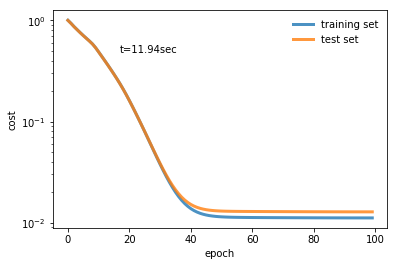

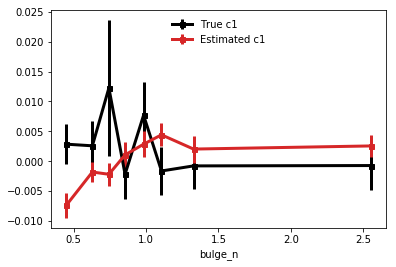

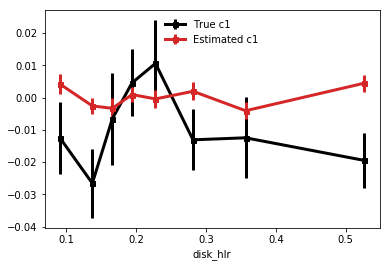

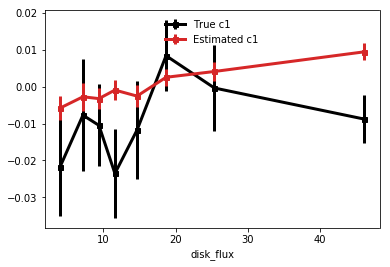

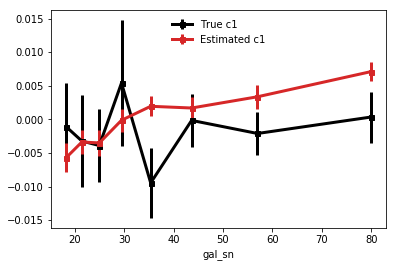

...

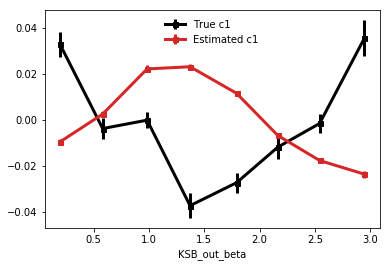

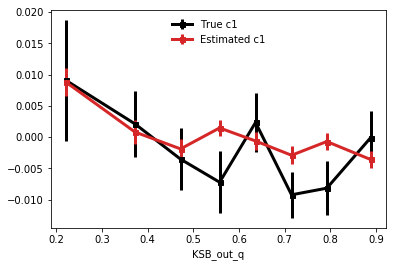

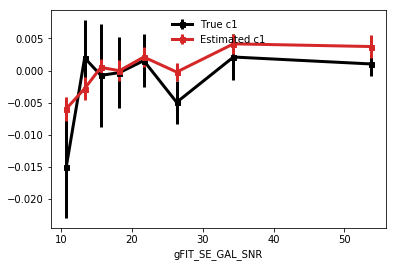

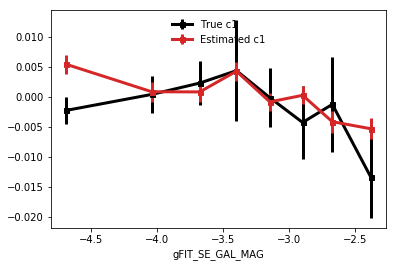

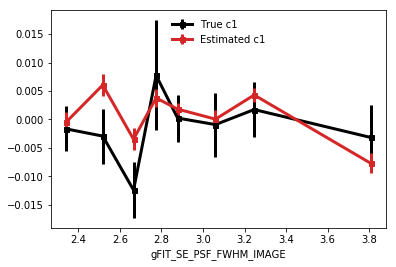

calculating gFIT_final_e1 gFIT_final_e2


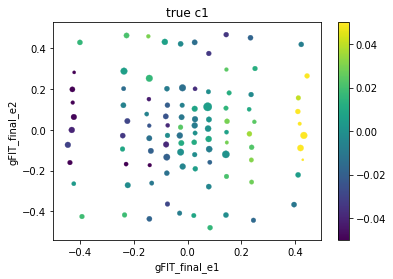

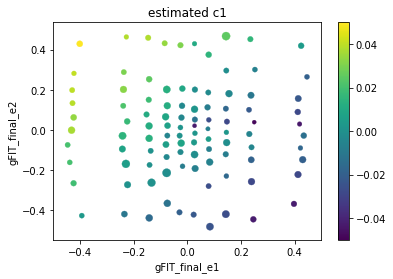

Chi^2 = 0.0019366141168280107


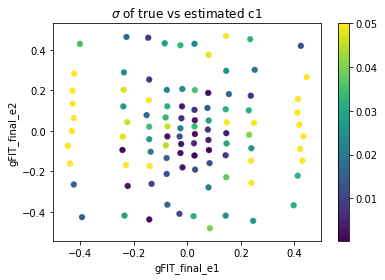

calculating KSB_final_e1 KSB_final_e2


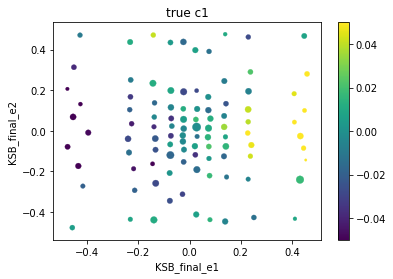

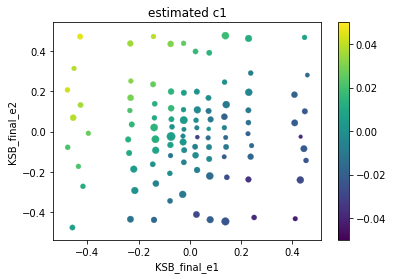

Chi^2 = 0.0022049253165652943


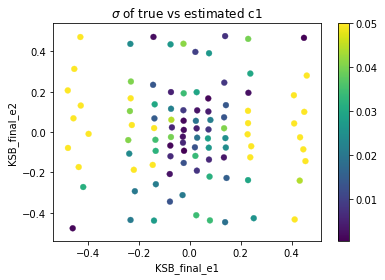

calculating g1_intrinsic g2_intrinsic


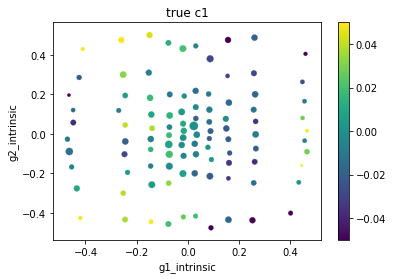

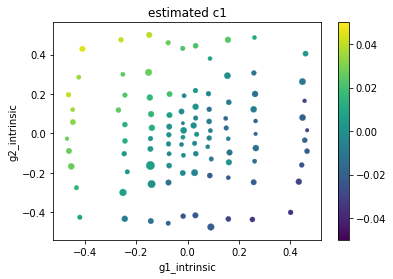

Chi^2 = 0.0011467024696039877


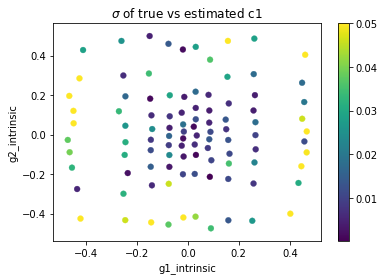

calculating gFIT_out_beta gFIT_out_q


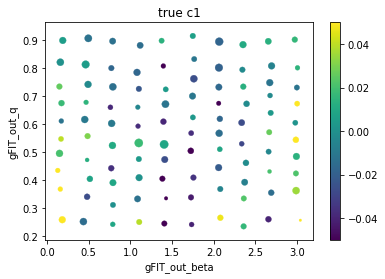

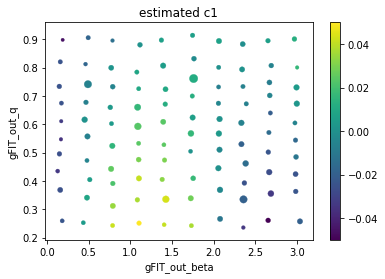

Chi^2 = 0.00220997777554059


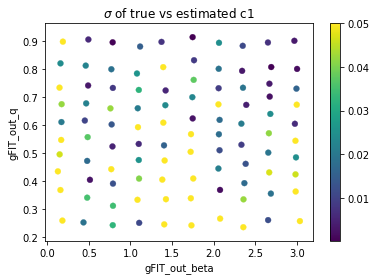

calculating KSB_out_beta KSB_out_q


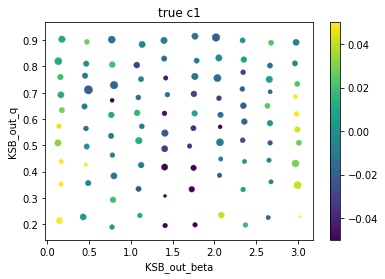

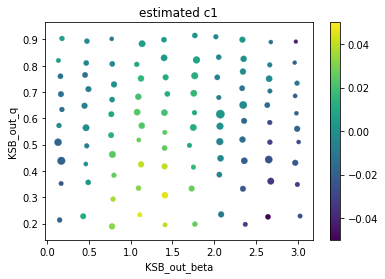

Chi^2 = 0.002427191588334517


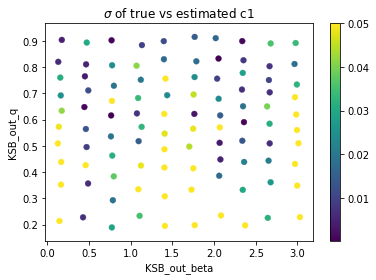

calculating in_beta in_q


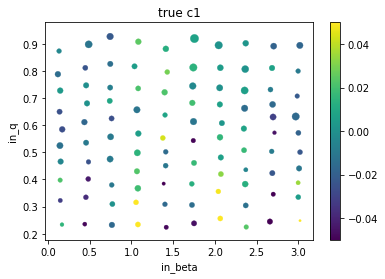

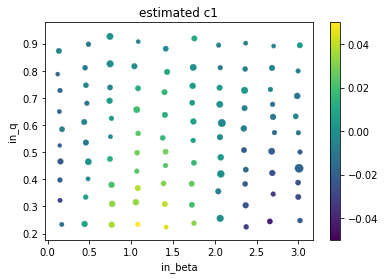

Chi^2 = 0.0012144629982032281


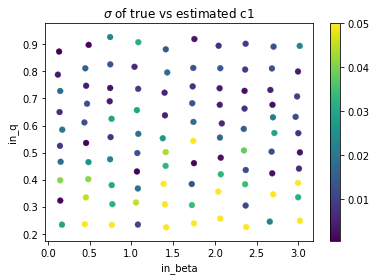

calculating bulge_hlr disk_hlr


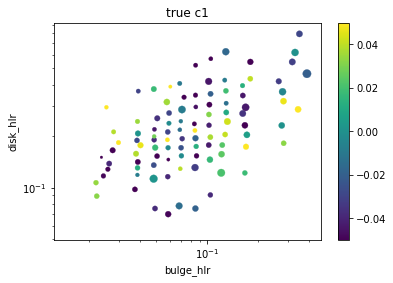

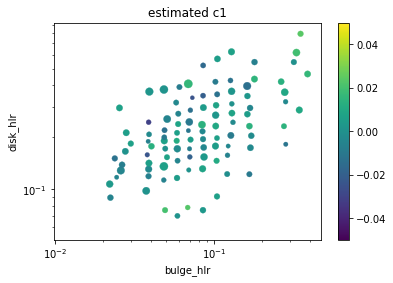

Chi^2 = 0.0020638413162571093


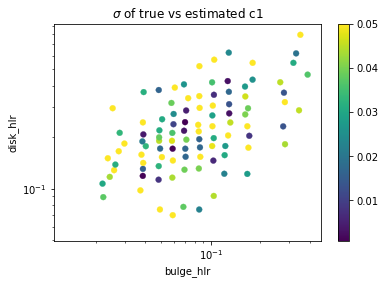

calculating bulge_flux disk_flux


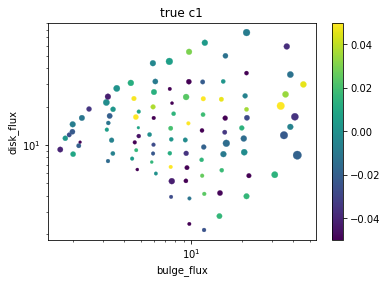

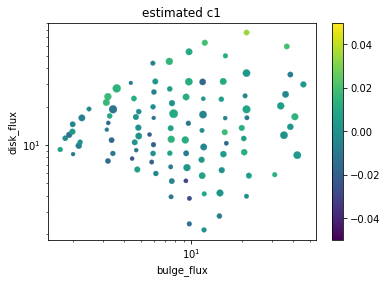

Chi^2 = 0.0014743591140464279


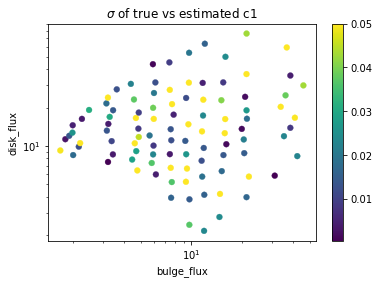

calculating KSB_out_sn gFIT_out_flux


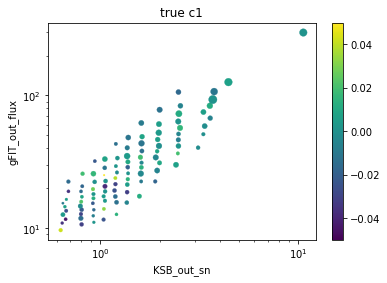

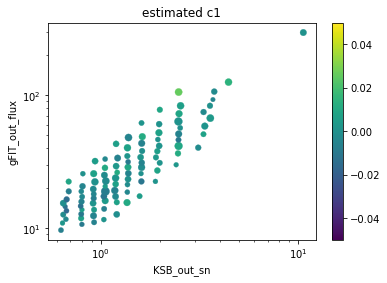

Chi^2 = 0.0004390483884262169


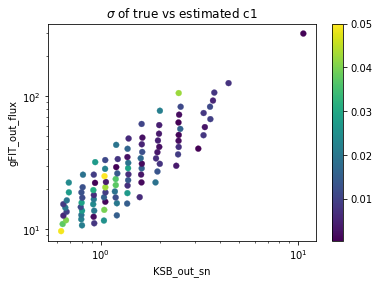

calculating bulge_hlr bulge_n


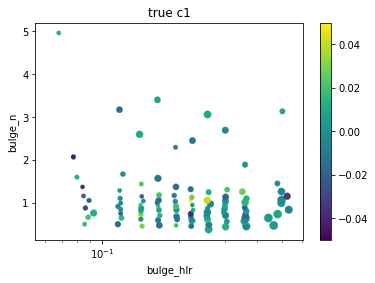

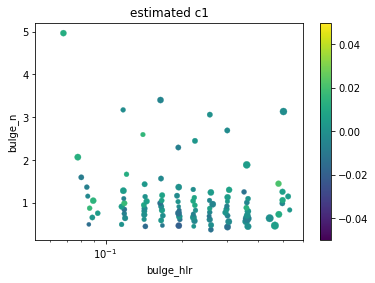

Chi^2 = 0.0005159504625840107


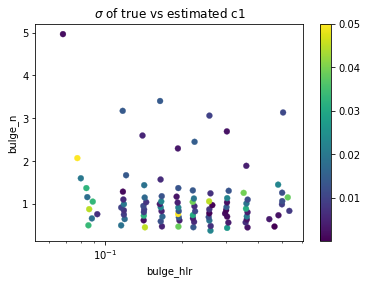

In [7]:
run nnsc.py output_data c1

#### dimensionality and architecture 

The number of hidden layers and nodes is defined for up to 5 layers with the parameters 'dim1', 'dim2', ..., 'dim5'. Each parameter defines the number of nodes per layer, and the number of layers is defined by the first one that is 0. If all of them are >0, then 5 hidden layers are build. 

Examples:

Here we use two hidden layers of 10 nodes each (using 30,000 objects for the training and 300 epochs):

In [15]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.952020  |    0   |
|     0.916915  |    1   |
|     0.879697  |    2   |
|     0.842203  |    3   |
|     0.808606  |    4   |
|     0.779370  |    5   |
|     0.758210  |    6   |
|     0.669862  |    7   |
|     0.616216  |    8   |
|     0.546314  |    9   |
|     0.469609  |    10   |
|     0.416569  |    11   |
|     0.358955  |    12   |
|     0.247146  |    13   |
|     0.177759  |    14   |
|     0.126570  |    15   |
|     0.089142  |    16   |
|     0.063629  |    17   |
|     0.047737  |    18   |
|     0.038436  |    19   |
|     0.033176  |    20   |
|     0.030260  |    21   |
|     0.028701  |    22   |
|     0.027931 

|     0.025506  |    275   |
|     0.025505  |    276   |
|     0.025504  |    277   |
|     0.025503  |    278   |
|     0.025502  |    279   |
|     0.025501  |    280   |
|     0.025501  |    281   |
|     0.025500  |    282   |
|     0.025499  |    283   |
|     0.025498  |    284   |
|     0.025498  |    285   |
|     0.025497  |    286   |
|     0.025497  |    287   |
|     0.025496  |    288   |
|     0.025496  |    289   |
|     0.025495  |    290   |
|     0.025495  |    291   |
|     0.025494  |    292   |
|     0.025494  |    293   |
|     0.025494  |    294   |
|     0.025494  |    295   |
|     0.025494  |    296   |
|     0.025493  |    297   |
|     0.025493  |    298   |
|     0.025493  |    299   |
Validate the estimation procedure

            _  _
          /u@)(@\        bias_ldae.py completed in 168.06 seconds
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
     

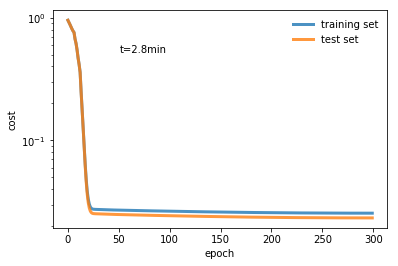

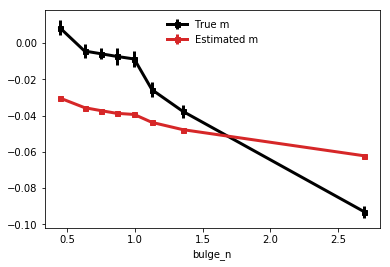

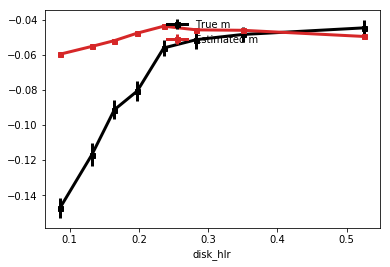

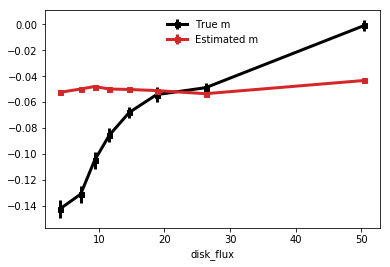

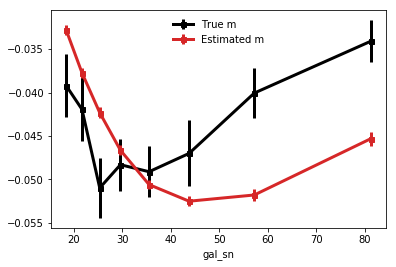

...

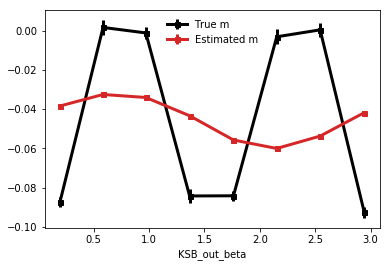

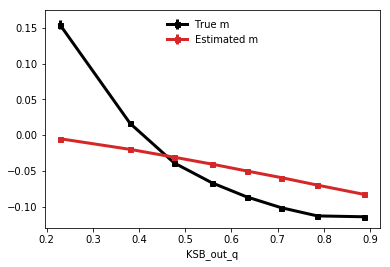

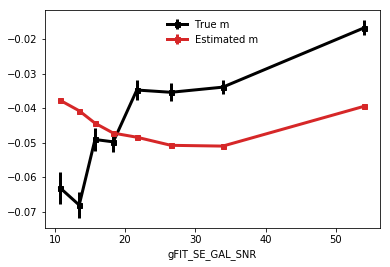

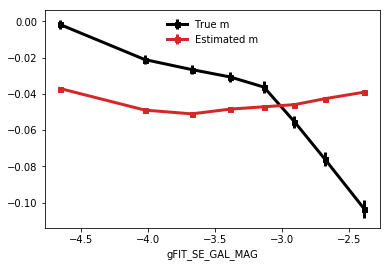

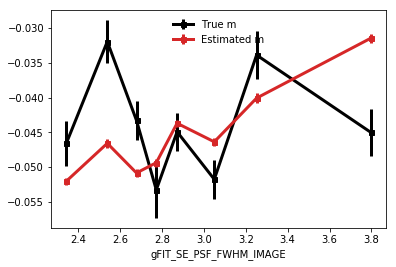

calculating gFIT_final_e1 gFIT_final_e2


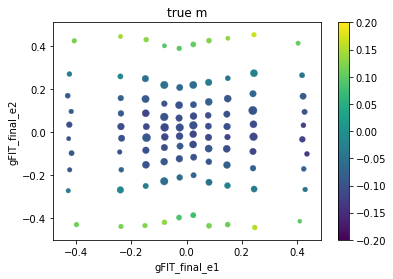

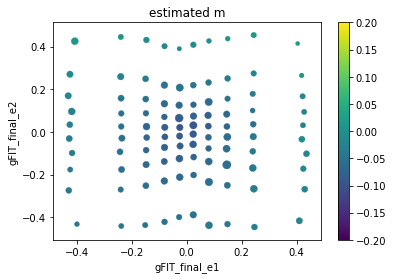

Chi^2 = 0.005386338588047977


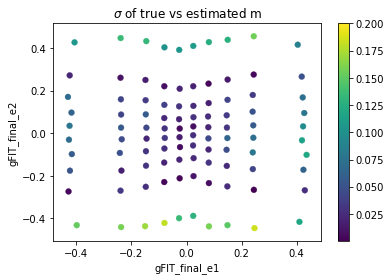

calculating KSB_final_e1 KSB_final_e2


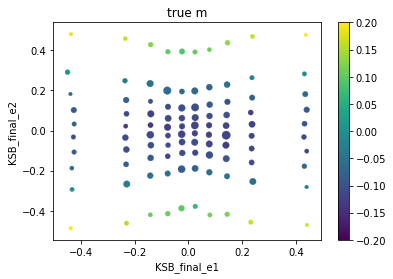

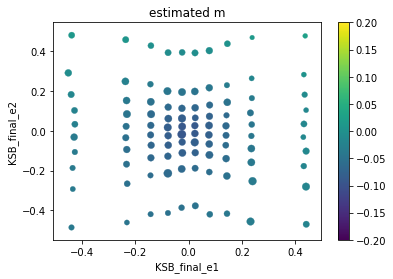

Chi^2 = 0.006627341812182648


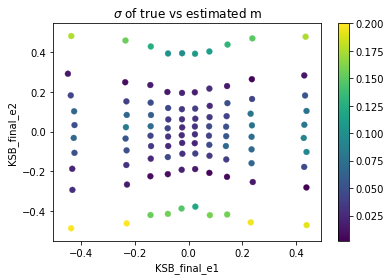

calculating g1_intrinsic g2_intrinsic


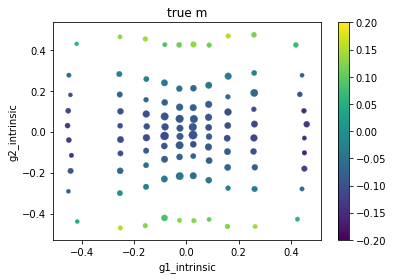

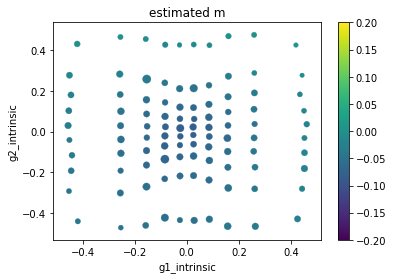

Chi^2 = 0.005853321782404977


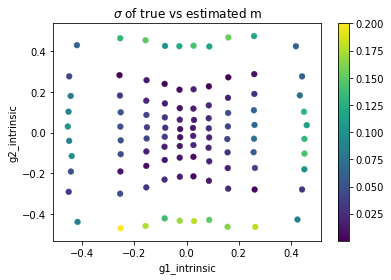

calculating gFIT_out_beta gFIT_out_q


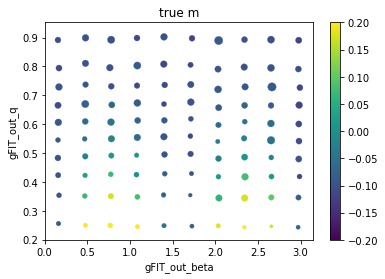

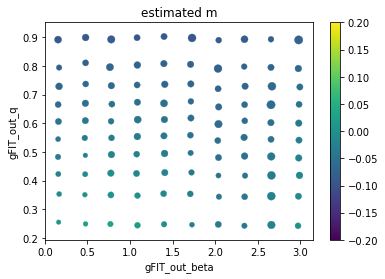

Chi^2 = 0.007163176431956241


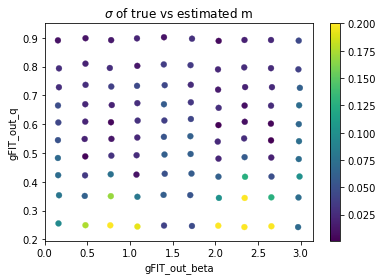

calculating KSB_out_beta KSB_out_q


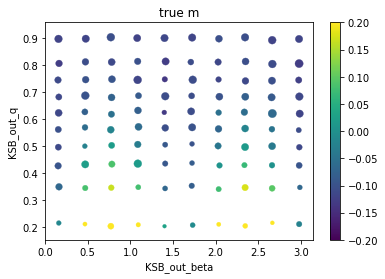

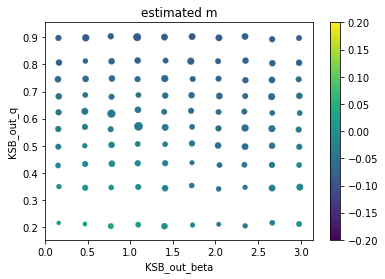

Chi^2 = 0.008664477833810507


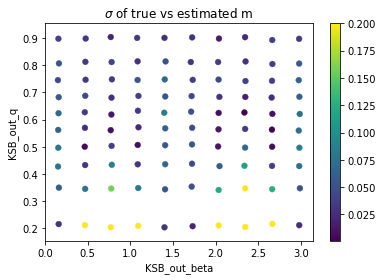

calculating in_beta in_q


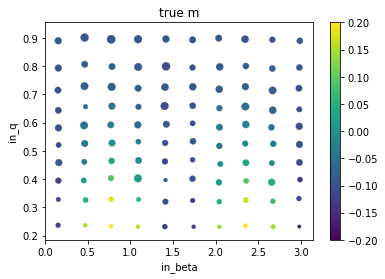

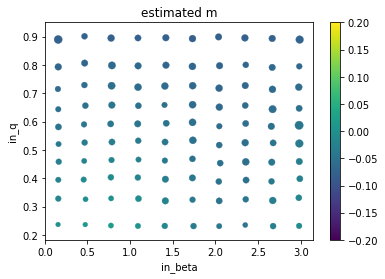

Chi^2 = 0.006828208296785161


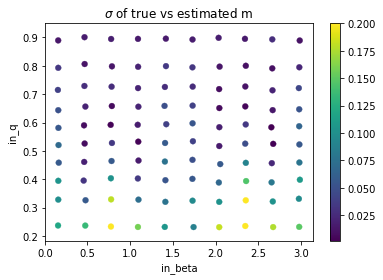

calculating bulge_hlr disk_hlr


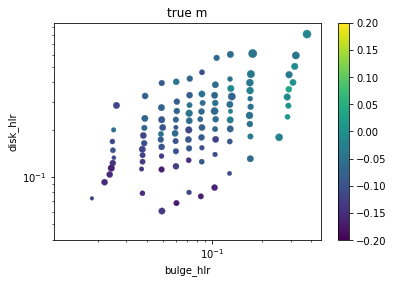

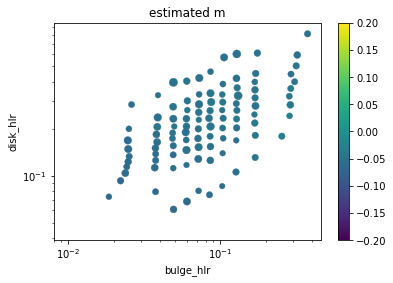

Chi^2 = 0.0022926152076368786


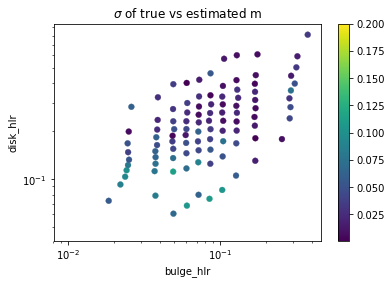

calculating bulge_flux disk_flux


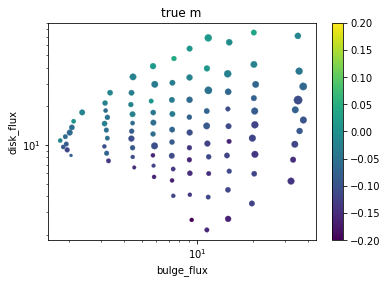

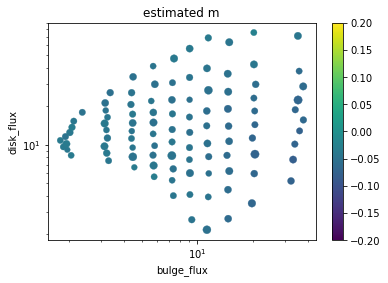

Chi^2 = 0.0032625200250762615


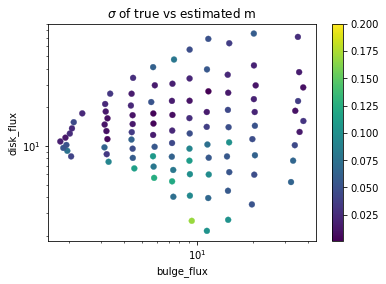

calculating KSB_out_sn gFIT_out_flux


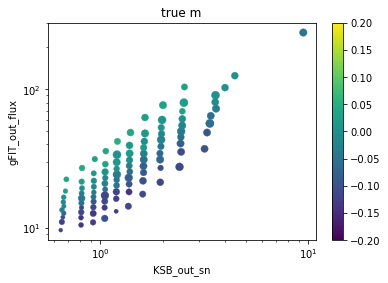

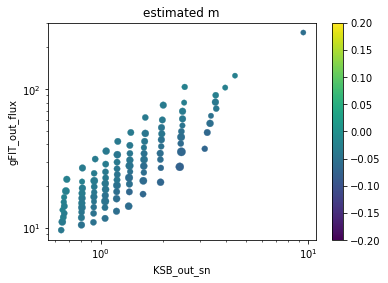

Chi^2 = 0.002318570304645225


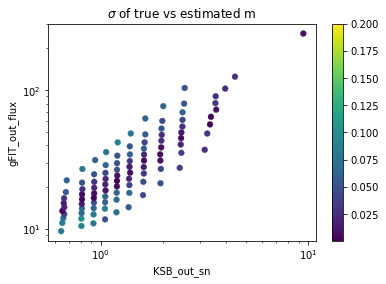

calculating bulge_hlr bulge_n


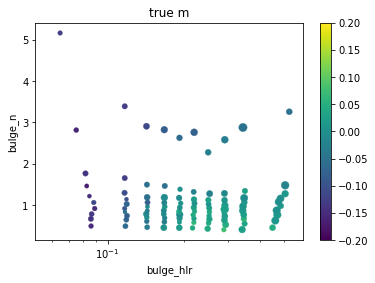

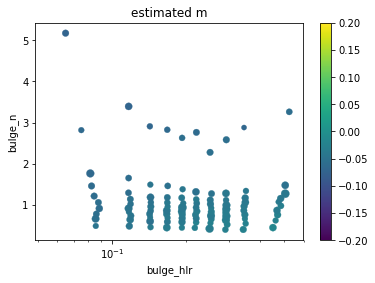

Chi^2 = 0.002812639038670528


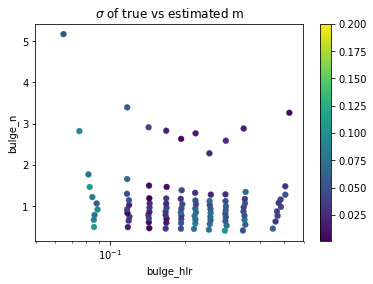

In [16]:
run nnsc.py n_train 30000 n_test 30000 n_epochs 300 dim1 10 dim2 10 dim3 0

Here we use five hidden layers of 50, 40, 30, 20 and 10 nodes instead: 

In [17]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.863997  |    0   |
|     0.759088  |    1   |
|     0.508275  |    2   |
|     0.238412  |    3   |
|     0.113716  |    4   |
|     0.060610  |    5   |
|     0.041277  |    6   |
|     0.035004  |    7   |
|     0.032442  |    8   |
|     0.031438  |    9   |
|     0.031096  |    10   |
|     0.030985  |    11   |
|     0.030932  |    12   |
|     0.030884  |    13   |
|     0.030830  |    14   |
|     0.030769  |    15   |
|     0.030698  |    16   |
|     0.030614  |    17   |
|     0.030504  |    18   |
|     0.030374  |    19   |
|     0.030263  |    20   |
|     0.030193  |    21   |
|     0.030133  |    22   |
|     0.030075 

|     0.026368  |    275   |
|     0.026366  |    276   |
|     0.026364  |    277   |
|     0.026362  |    278   |
|     0.026360  |    279   |
|     0.026359  |    280   |
|     0.026357  |    281   |
|     0.026355  |    282   |
|     0.026354  |    283   |
|     0.026352  |    284   |
|     0.026351  |    285   |
|     0.026350  |    286   |
|     0.026349  |    287   |
|     0.026348  |    288   |
|     0.026347  |    289   |
|     0.026346  |    290   |
|     0.026345  |    291   |
|     0.026345  |    292   |
|     0.026344  |    293   |
|     0.026344  |    294   |
|     0.026343  |    295   |
|     0.026343  |    296   |
|     0.026343  |    297   |
|     0.026343  |    298   |
|     0.026343  |    299   |
Validate the estimation procedure

            _  _
          /u@)(@\        bias_ldae.py completed in 169.58 seconds
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
     

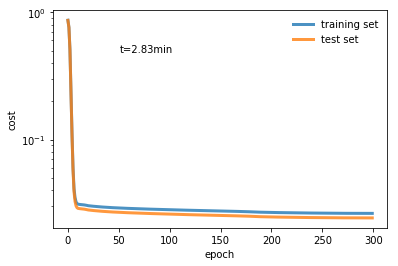

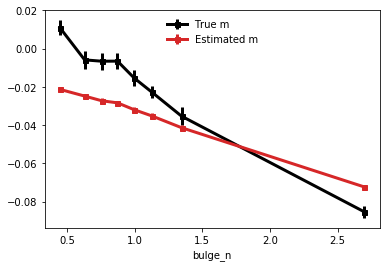

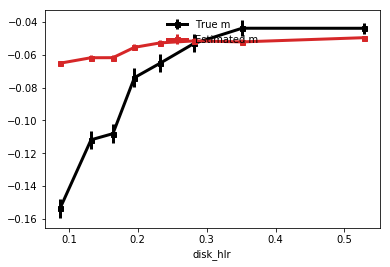

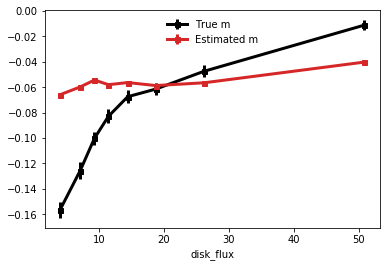

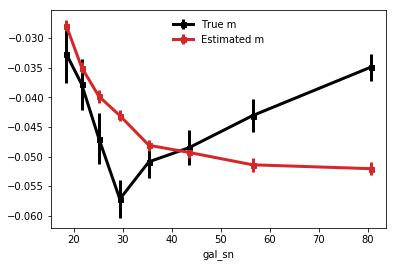

...

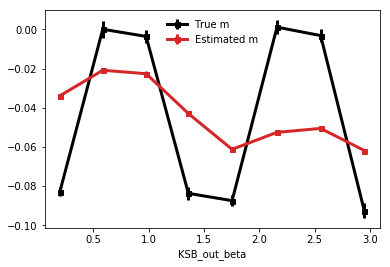

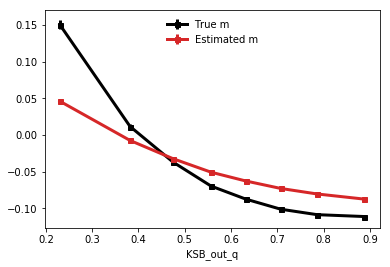

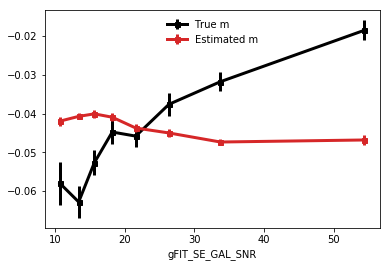

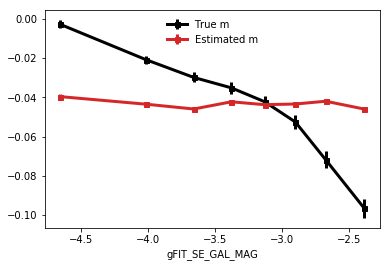

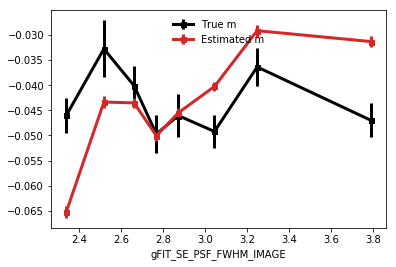

calculating gFIT_final_e1 gFIT_final_e2


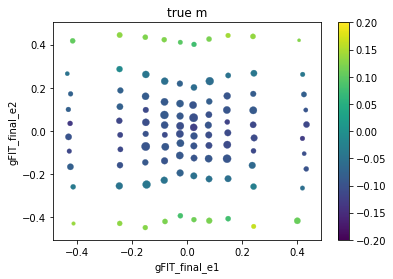

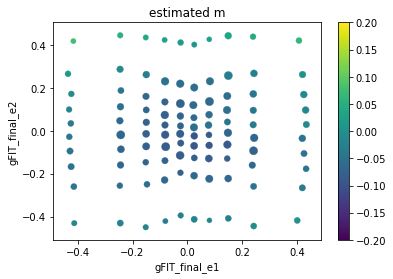

Chi^2 = 0.00378287233983179


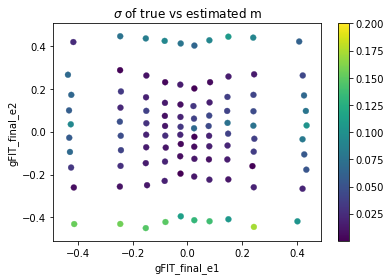

calculating KSB_final_e1 KSB_final_e2


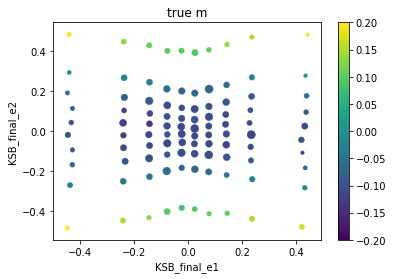

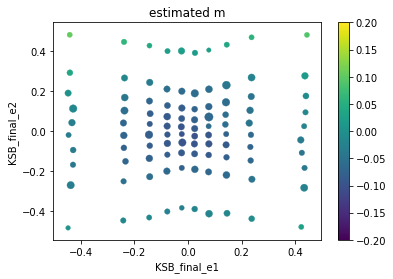

Chi^2 = 0.00394313624037716


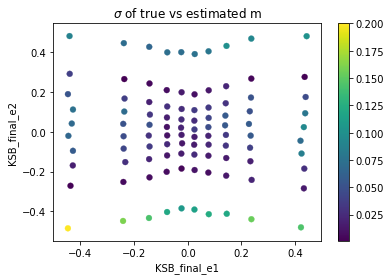

calculating g1_intrinsic g2_intrinsic


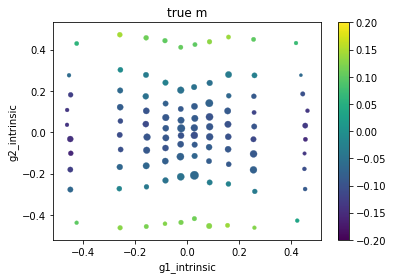

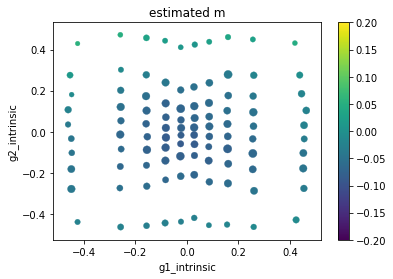

Chi^2 = 0.004305059172311311


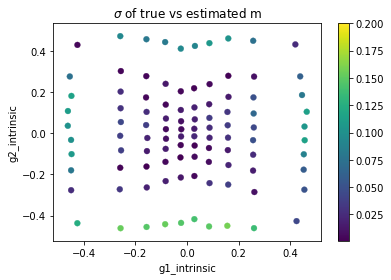

calculating gFIT_out_beta gFIT_out_q


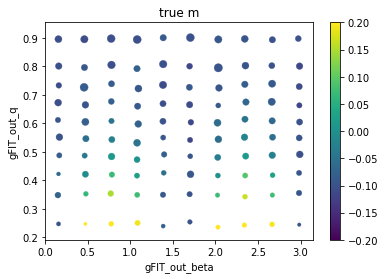

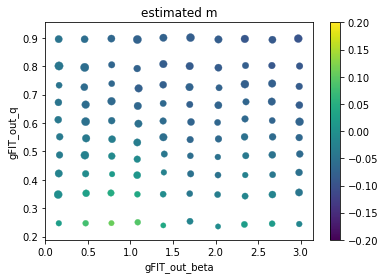

Chi^2 = 0.004931580879851555


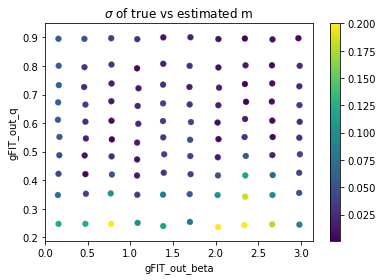

calculating KSB_out_beta KSB_out_q


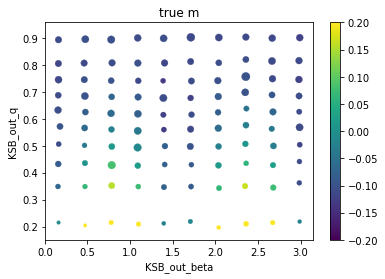

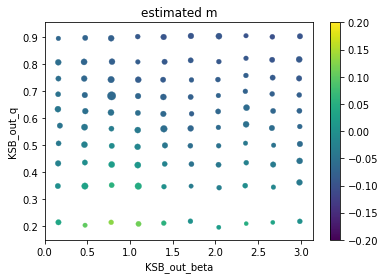

Chi^2 = 0.005290374393148303


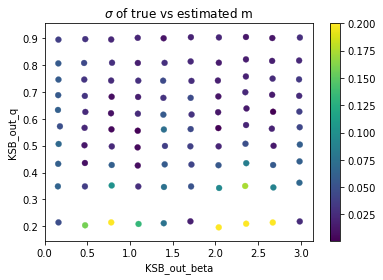

calculating in_beta in_q


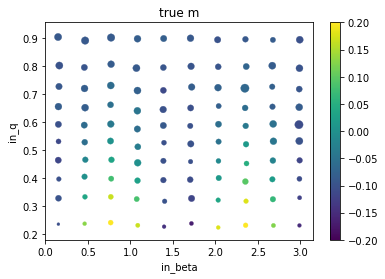

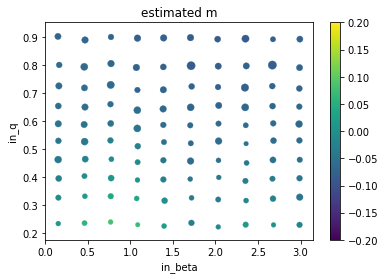

Chi^2 = 0.005062387474931134


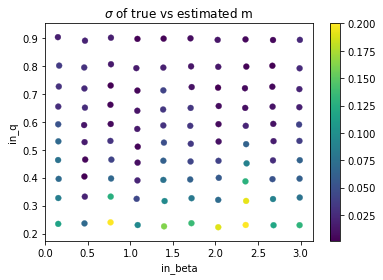

calculating bulge_hlr disk_hlr


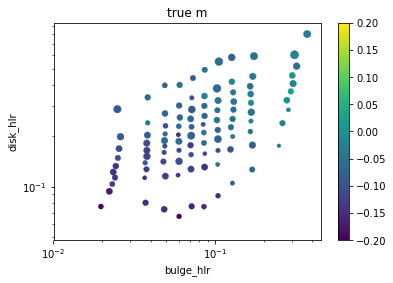

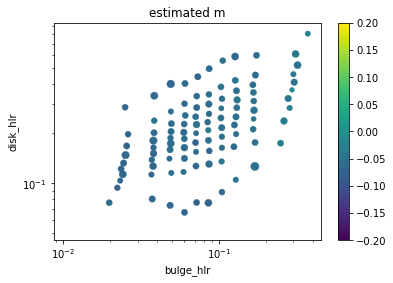

Chi^2 = 0.001976956861899671


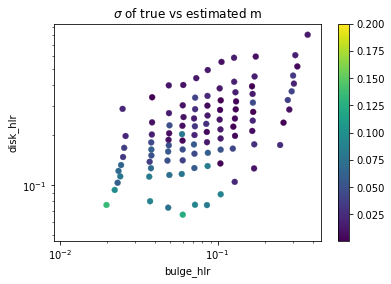

calculating bulge_flux disk_flux


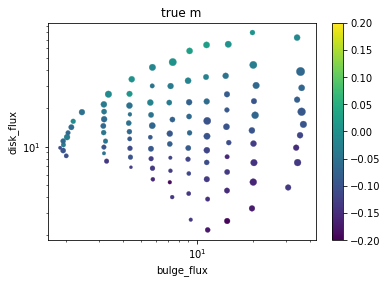

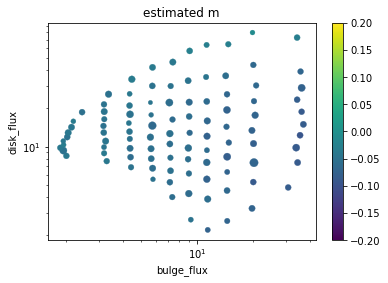

Chi^2 = 0.0023100168251042174


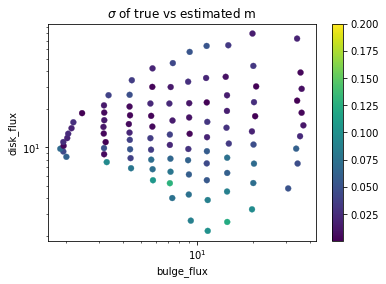

calculating KSB_out_sn gFIT_out_flux


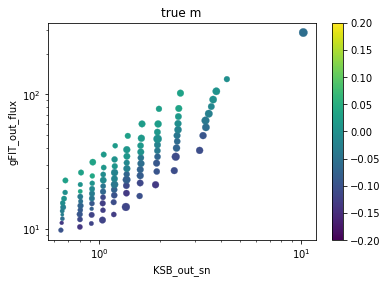

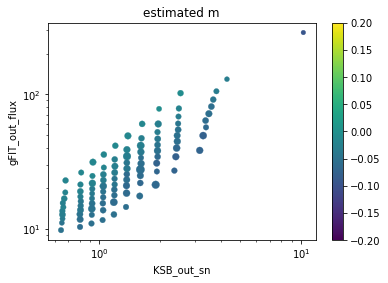

Chi^2 = 0.0014940453419934544


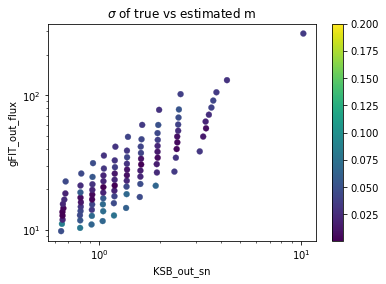

calculating bulge_hlr bulge_n


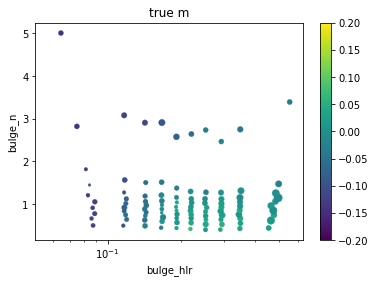

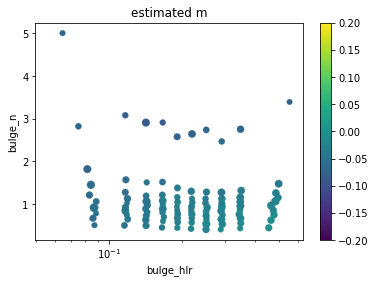

Chi^2 = 0.0016754898333970183


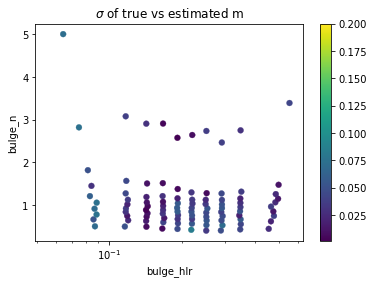

In [18]:
run nnsc.py n_train 30000 n_test 30000 n_epochs 300 dim1 10 dim2 10 dim3 0

#### selection 

The parameter 'selection' specifies the input properties to be used for the training. The specific options and the selected data can be found in nnsc/import_data.py, in the method get_input_data() 

Example:

The following runs NNSC using only the q (axis ratio) and beta (orientation angle) of galaxies measured with gFIT and KSB:

In [19]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.910485  |    0   |
|     0.903617  |    1   |
|     0.896689  |    2   |
|     0.889813  |    3   |
|     0.882991  |    4   |
|     0.876140  |    5   |
|     0.869212  |    6   |
|     0.862123  |    7   |
|     0.854826  |    8   |
|     0.847309  |    9   |
|     0.839560  |    10   |
|     0.831536  |    11   |
|     0.823279  |    12   |
|     0.814839  |    13   |
|     0.806223  |    14   |
|     0.797541  |    15   |
|     0.788800  |    16   |
|     0.779980  |    17   |
|     0.771082  |    18   |
|     0.762070  |    19   |
|     0.752915  |    20   |
|     0.743541  |    21   |
|     0.734003  |    22   |
|     0.724516 

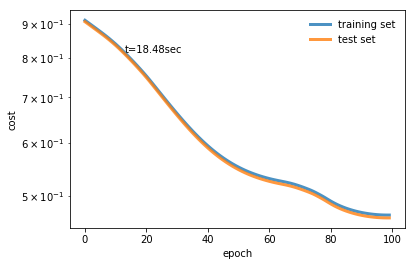

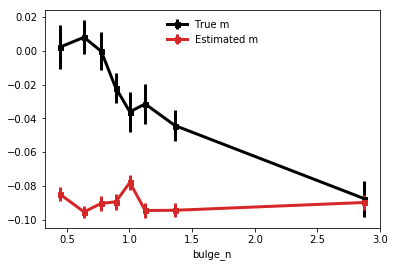

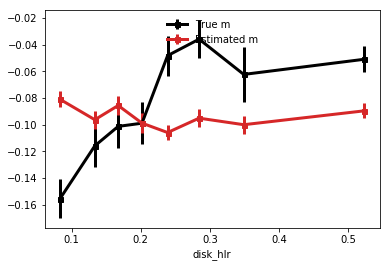

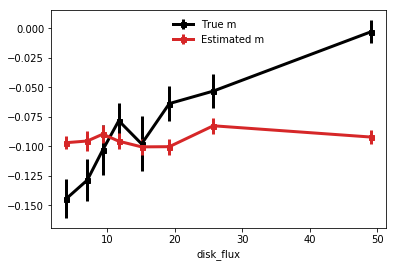

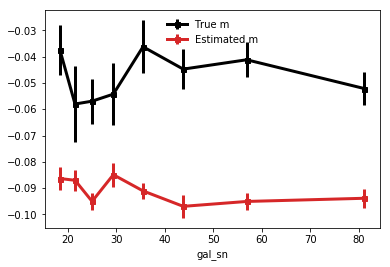

...

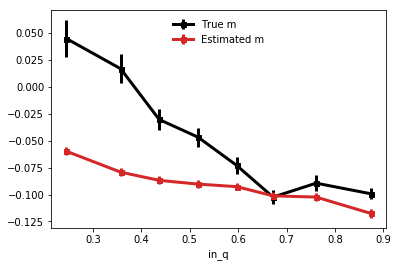

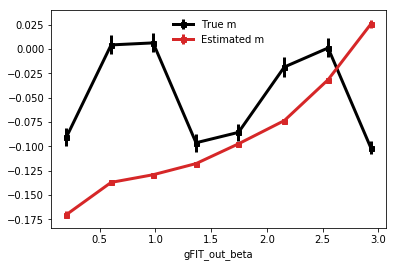

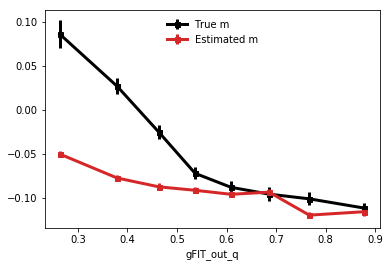

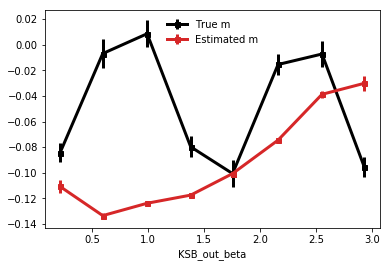

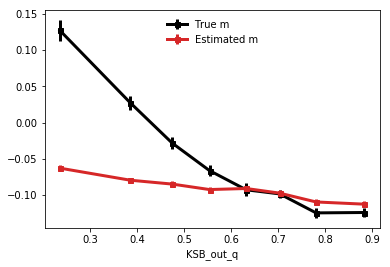

calculating g1_intrinsic g2_intrinsic


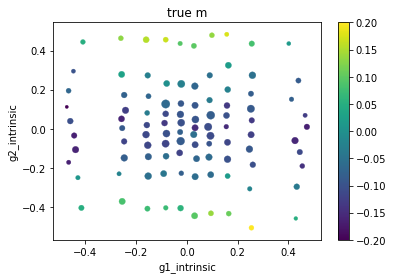

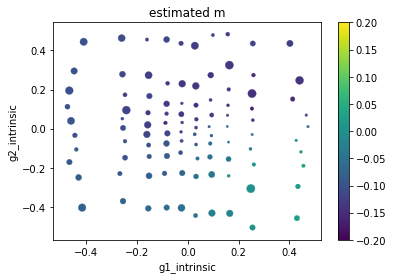

Chi^2 = 0.010949231572464578


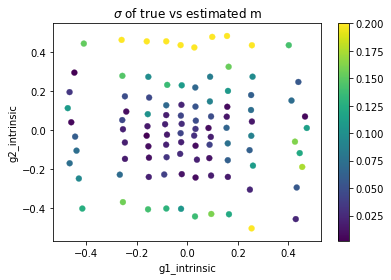

calculating gFIT_out_beta gFIT_out_q


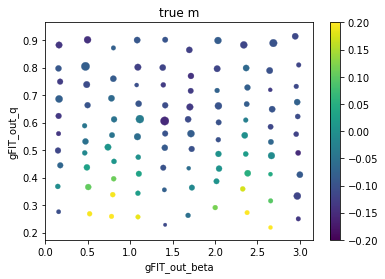

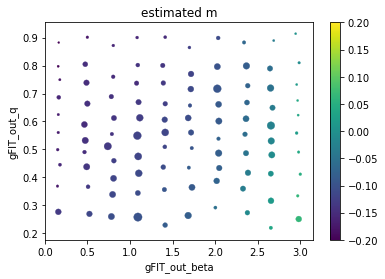

Chi^2 = 0.01333523341599202


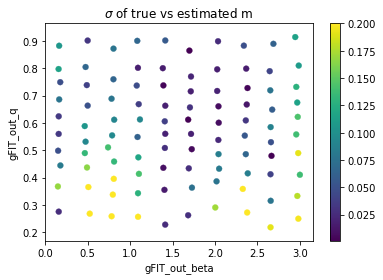

calculating KSB_out_beta KSB_out_q


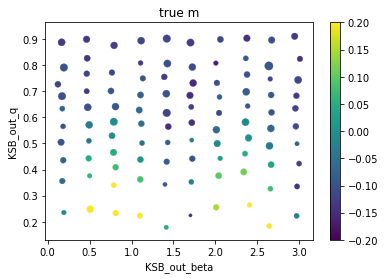

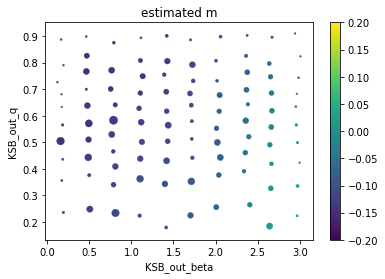

Chi^2 = 0.013147270943971983


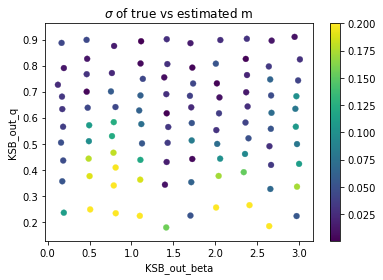

calculating in_beta in_q


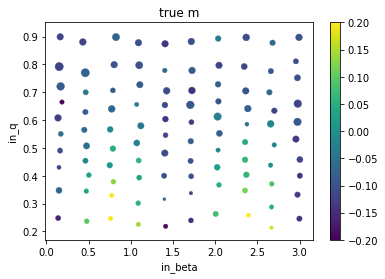

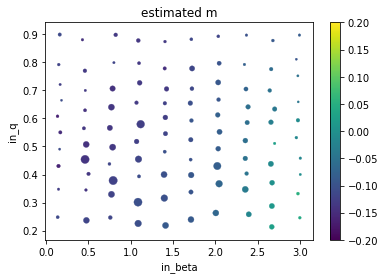

Chi^2 = 0.01154334350380856


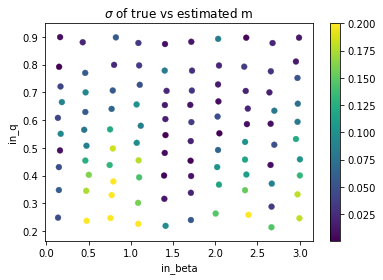

calculating bulge_hlr disk_hlr


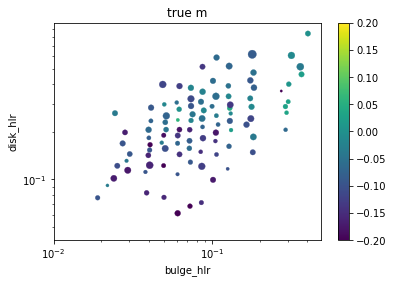

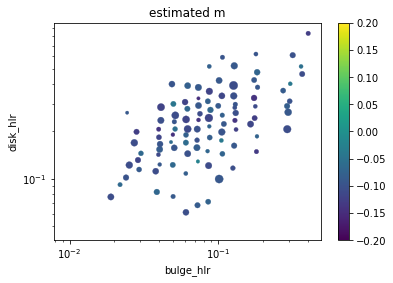

Chi^2 = 0.005082878350304916


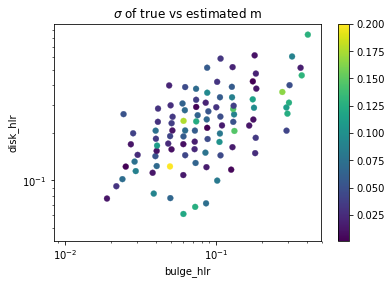

calculating bulge_flux disk_flux


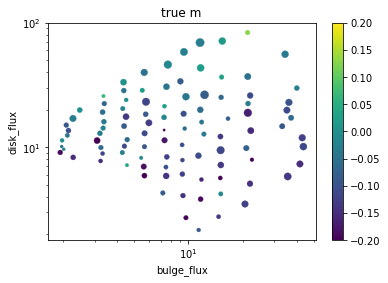

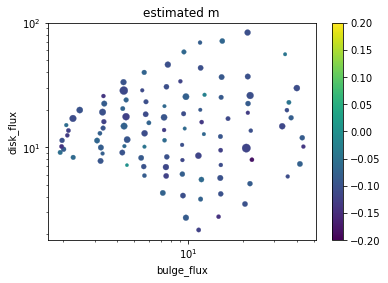

Chi^2 = 0.00513874238768561


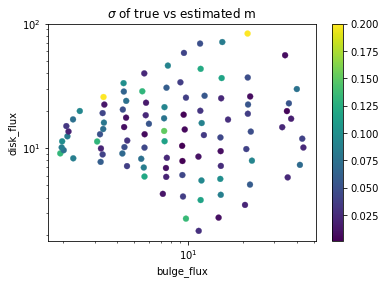

calculating bulge_hlr bulge_n


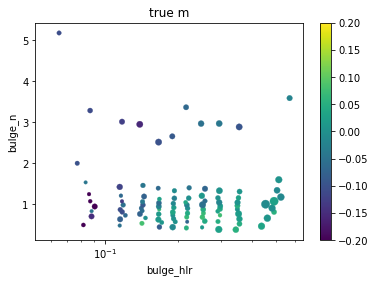

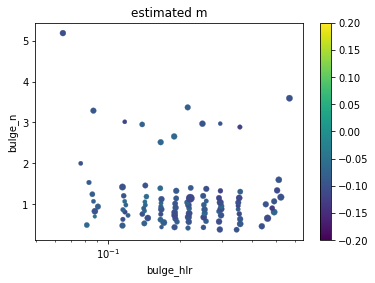

Chi^2 = 0.009452349414101302


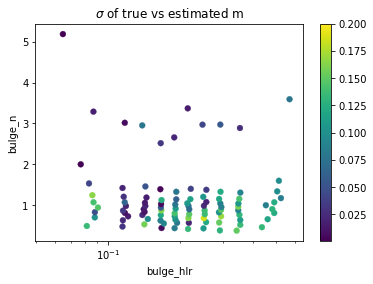

In [20]:
run nnsc.py selection qbeta

#### version

This parameter specifies the activation functions used for the different layers of the neural network. The default uses Leaky ReLU activations for all nodes, except for the last one, where a linear operation is done. For the other options see the description from the method ParamEstModel() in nnsc/deep_reg.py.

Example:

Here we run the method using tanh as activation functions instead of Leaky ReLU:

In [21]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>

In [25]:
run nnsc.py version deep_regh show False 


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.074467  |    0   |
|     0.060339  |    1   |
|     0.049821  |    2   |
|     0.042456  |    3   |
|     0.037639  |    4   |
|     0.034692  |    5   |
|     0.032997  |    6   |
|     0.032068  |    7   |
|     0.031572  |    8   |
|     0.031303  |    9   |
|     0.031144  |    10   |
|     0.031036  |    11   |
|     0.030948  |    12   |
|     0.030870  |    13   |
|     0.030796  |    14   |
|     0.030724  |    15   |
|     0.030654  |    16   |
|     0.030585  |    17   |
|     0.030518  |    18   |
|     0.030452  |    19   |
|     0.030387  |    20   |
|     0.030324  |    21   |
|     0.030263  |    22   |
|     0.030203 

#### lr_decay 

'lr_decay' defines how many epochs are run before a decay rate for the learning rate is applied. 

Examples:

Here we compare a lr_decay of 15 with a lr_decay of 300 using 600 epochs and an initial learning rate of 0.02 to show the impact of this parameter:

In [33]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.026816  |    0   |
|     0.024758  |    1   |
|     0.026823  |    2   |
|     0.025366  |    3   |
|     0.026868  |    4   |
|     0.025177  |    5   |
|     0.026265  |    6   |
|     0.024774  |    7   |
|     0.026252  |    8   |
|     0.025629  |    9   |
|     0.025731  |    10   |
|     0.024318  |    11   |
|     0.021848  |    12   |
|     0.024461  |    13   |
|     0.022817  |    14   |
|     0.022550  |    15   |
|     0.024317  |    16   |
|     0.022398  |    17   |
|     0.023666  |    18   |
|     0.023970  |    19   |
|     0.022919  |    20   |
|     0.021201  |    21   |
|     0.021507  |    22   |
|     0.022251 

|     0.019932  |    275   |
|     0.019967  |    276   |
|     0.019957  |    277   |
|     0.019906  |    278   |
|     0.019945  |    279   |
|     0.019953  |    280   |
|     0.019945  |    281   |
|     0.019896  |    282   |
|     0.019921  |    283   |
|     0.019936  |    284   |
|     0.019916  |    285   |
|     0.019940  |    286   |
|     0.019907  |    287   |
|     0.019900  |    288   |
|     0.019895  |    289   |
|     0.019903  |    290   |
|     0.019922  |    291   |
|     0.019914  |    292   |
|     0.019893  |    293   |
|     0.019903  |    294   |
|     0.019916  |    295   |
|     0.019881  |    296   |
|     0.019902  |    297   |
|     0.019892  |    298   |
|     0.019887  |    299   |
|     0.019889  |    300   |
|     0.019893  |    301   |
|     0.019882  |    302   |
|     0.019887  |    303   |
|     0.019880  |    304   |
|     0.019887  |    305   |
|     0.019882  |    306   |
|     0.019885  |    307   |
|     0.019884  |    308   |
|     0.019884

|     0.019626  |    558   |
|     0.019642  |    559   |
|     0.019632  |    560   |
|     0.019632  |    561   |
|     0.019610  |    562   |
|     0.019614  |    563   |
|     0.019589  |    564   |
|     0.019576  |    565   |
|     0.019594  |    566   |
|     0.019561  |    567   |
|     0.019561  |    568   |
|     0.019488  |    569   |
|     0.019493  |    570   |
|     0.019440  |    571   |
|     0.019391  |    572   |
|     0.019377  |    573   |
|     0.019319  |    574   |
|     0.019260  |    575   |
|     0.019299  |    576   |
|     0.019194  |    577   |
|     0.019224  |    578   |
|     0.019155  |    579   |
|     0.019179  |    580   |
|     0.019114  |    581   |
|     0.019082  |    582   |
|     0.019080  |    583   |
|     0.019118  |    584   |
|     0.019054  |    585   |
|     0.019088  |    586   |
|     0.019032  |    587   |
|     0.019044  |    588   |
|     0.019007  |    589   |
|     0.019016  |    590   |
|     0.018988  |    591   |
|     0.018993

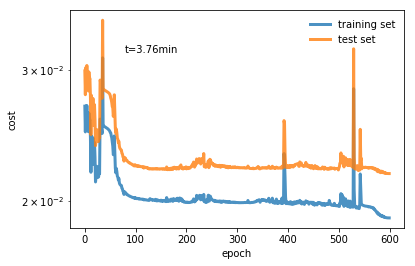

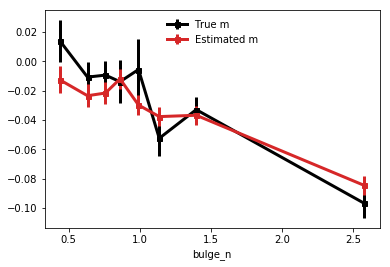

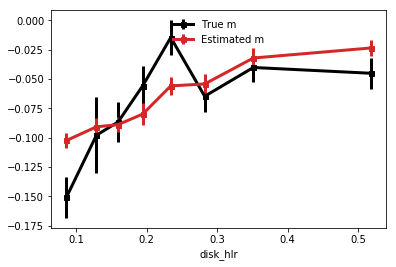

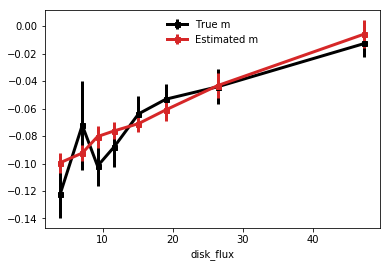

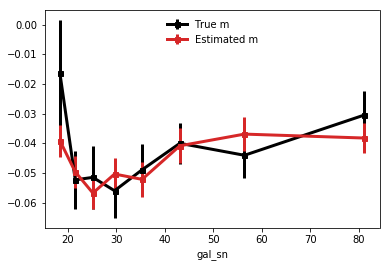

...

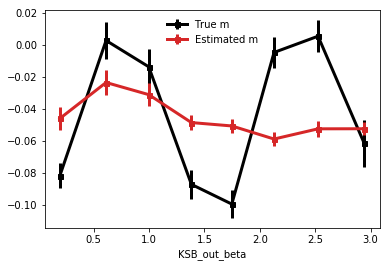

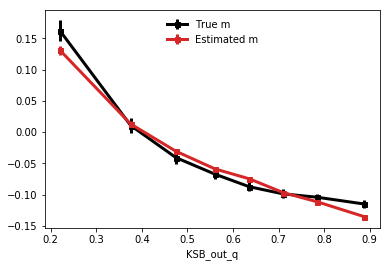

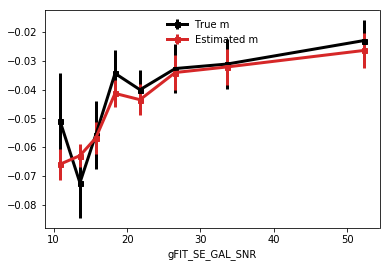

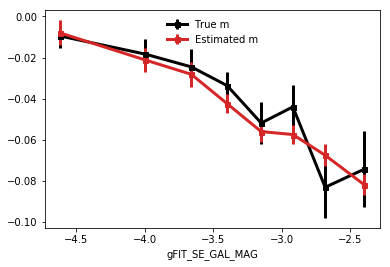

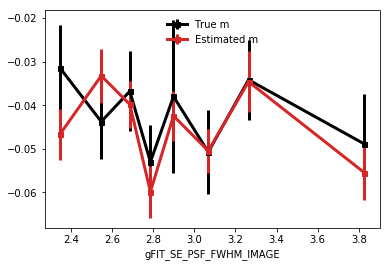

calculating gFIT_final_e1 gFIT_final_e2


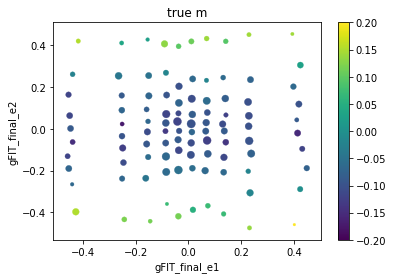

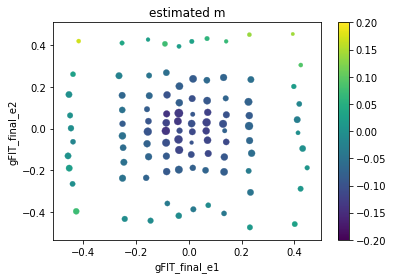

Chi^2 = 0.003783211654110915


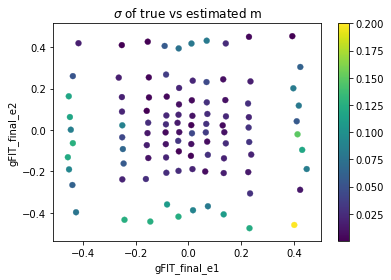

calculating KSB_final_e1 KSB_final_e2


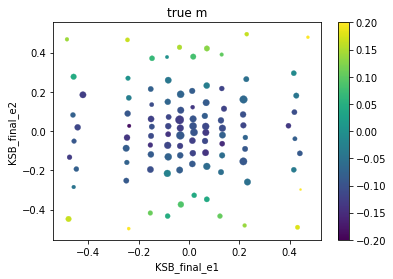

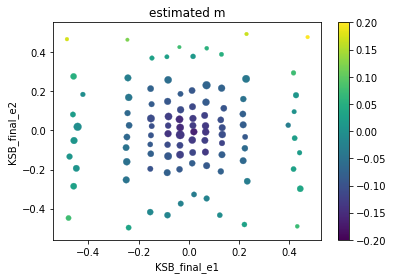

Chi^2 = 0.004007168425200241


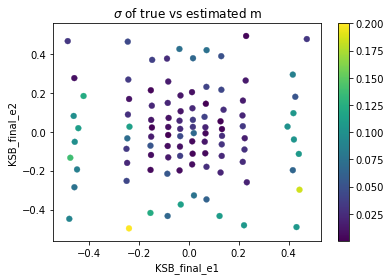

calculating g1_intrinsic g2_intrinsic


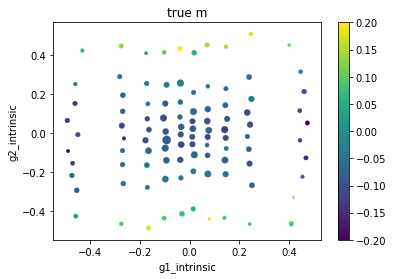

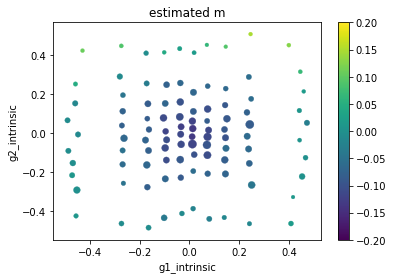

Chi^2 = 0.005032929628343642


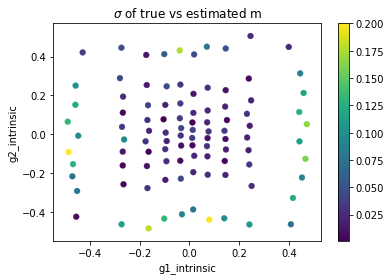

calculating gFIT_out_beta gFIT_out_q


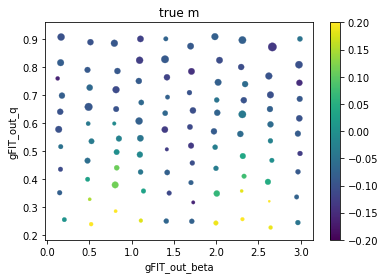

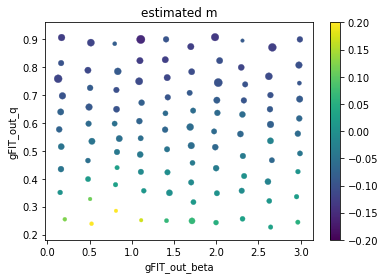

Chi^2 = 0.004719616461657858


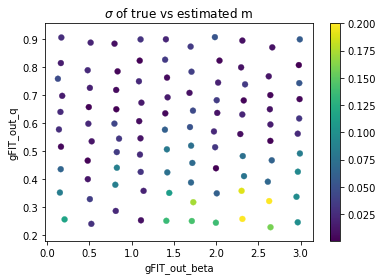

calculating KSB_out_beta KSB_out_q


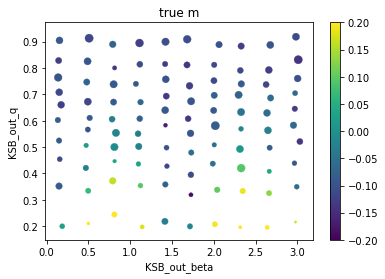

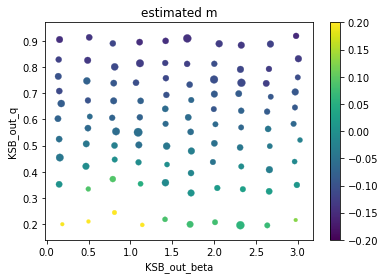

Chi^2 = 0.004578144594475302


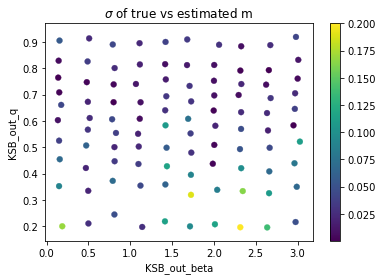

calculating in_beta in_q


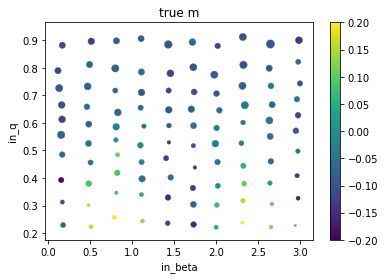

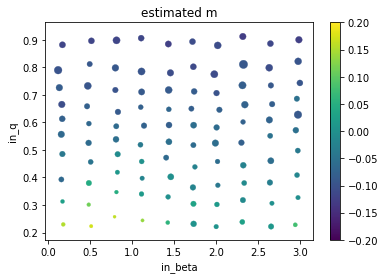

Chi^2 = 0.005580099540753175


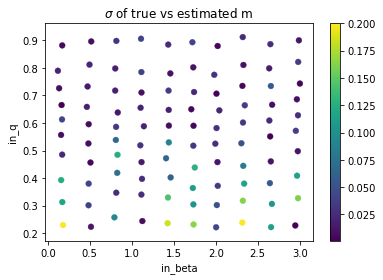

calculating bulge_hlr disk_hlr


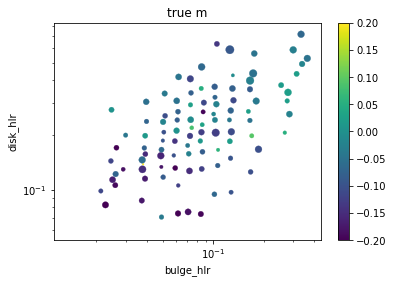

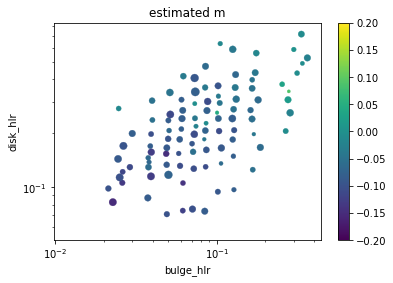

Chi^2 = 0.0038491253397087


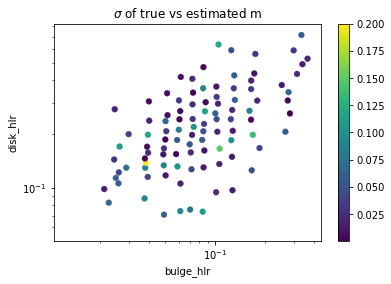

calculating bulge_flux disk_flux


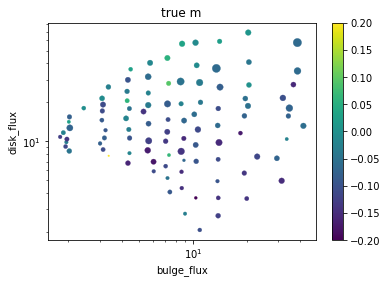

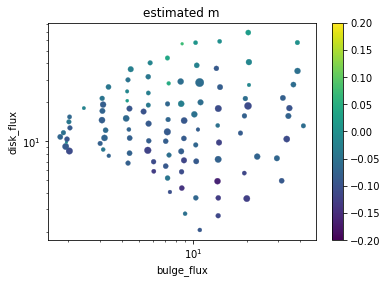

Chi^2 = 0.0034961307329958585


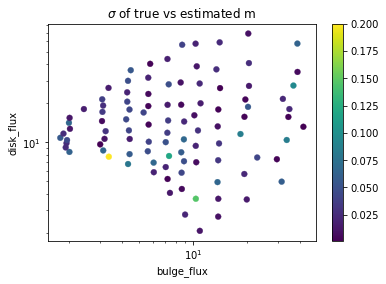

calculating KSB_out_sn gFIT_out_flux


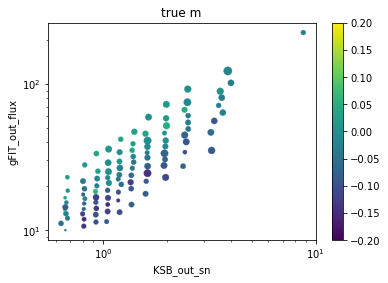

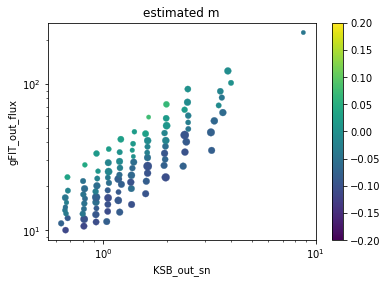

Chi^2 = 0.000965784658360414


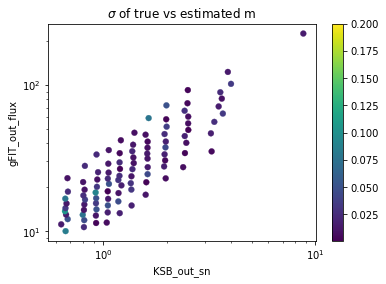

calculating bulge_hlr bulge_n


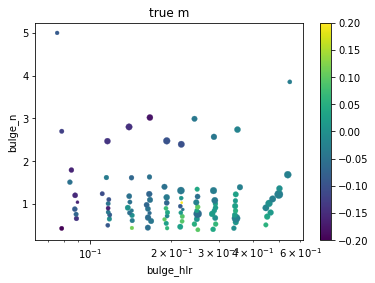

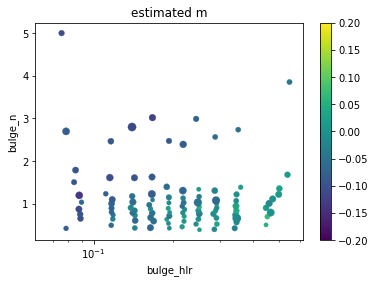

Chi^2 = 0.0021857577113403625


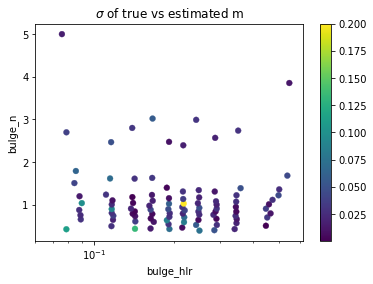

In [34]:
run nnsc.py n_epochs 600 lr_decay 15 learning_rate 0.02


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.030111  |    0   |
|     0.028459  |    1   |
|     0.027223  |    2   |
|     0.026785  |    3   |
|     0.027141  |    4   |
|     0.026955  |    5   |
|     0.026696  |    6   |
|     0.026667  |    7   |
|     0.026483  |    8   |
|     0.025542  |    9   |
|     0.025847  |    10   |
|     0.026137  |    11   |
|     0.025793  |    12   |
|     0.023837  |    13   |
|     0.024131  |    14   |
|     0.022554  |    15   |
|     0.022348  |    16   |
|     0.026425  |    17   |
|     0.022318  |    18   |
|     0.022778  |    19   |
|     0.022023  |    20   |
|     0.021638  |    21   |
|     0.021476  |    22   |
|     0.021427 

|     0.026461  |    277   |
|     0.026462  |    278   |
|     0.026461  |    279   |
|     0.026456  |    280   |
|     0.026448  |    281   |
|     0.026438  |    282   |
|     0.026425  |    283   |
|     0.026410  |    284   |
|     0.026393  |    285   |
|     0.026375  |    286   |
|     0.026354  |    287   |
|     0.026333  |    288   |
|     0.026312  |    289   |
|     0.026289  |    290   |
|     0.026267  |    291   |
|     0.026244  |    292   |
|     0.026220  |    293   |
|     0.026197  |    294   |
|     0.026172  |    295   |
|     0.026146  |    296   |
|     0.026120  |    297   |
|     0.026092  |    298   |
|     0.026064  |    299   |
|     0.025989  |    300   |
|     0.025907  |    301   |
|     0.025831  |    302   |
|     0.025764  |    303   |
|     0.025705  |    304   |
|     0.025653  |    305   |
|     0.025607  |    306   |
|     0.025565  |    307   |
|     0.025527  |    308   |
|     0.025492  |    309   |
|     0.025459  |    310   |
|     0.025428

|     0.020797  |    560   |
|     0.020788  |    561   |
|     0.020782  |    562   |
|     0.020780  |    563   |
|     0.020782  |    564   |
|     0.020793  |    565   |
|     0.020814  |    566   |
|     0.020846  |    567   |
|     0.020886  |    568   |
|     0.020928  |    569   |
|     0.020964  |    570   |
|     0.020993  |    571   |
|     0.021020  |    572   |
|     0.021053  |    573   |
|     0.021105  |    574   |
|     0.021188  |    575   |
|     0.021316  |    576   |
|     0.021493  |    577   |
|     0.021645  |    578   |
|     0.021580  |    579   |
|     0.021204  |    580   |
|     0.020872  |    581   |
|     0.020754  |    582   |
|     0.020723  |    583   |
|     0.020714  |    584   |
|     0.020749  |    585   |
|     0.020715  |    586   |
|     0.020717  |    587   |
|     0.020741  |    588   |
|     0.020792  |    589   |
|     0.020842  |    590   |
|     0.020878  |    591   |
|     0.020921  |    592   |
|     0.020965  |    593   |
|     0.020940

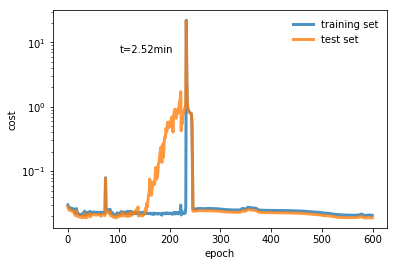

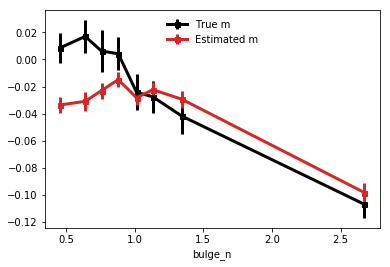

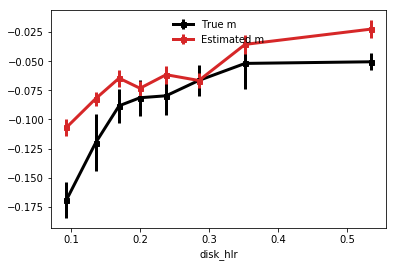

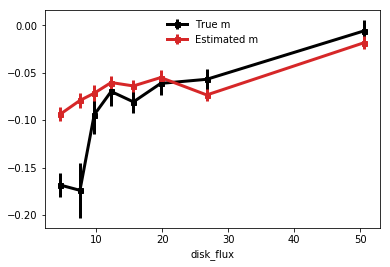

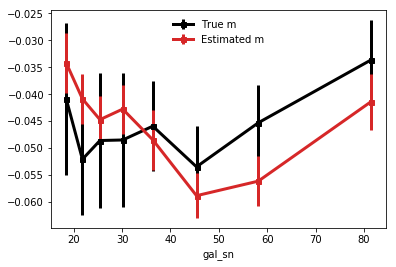

...

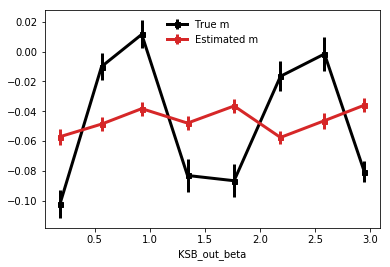

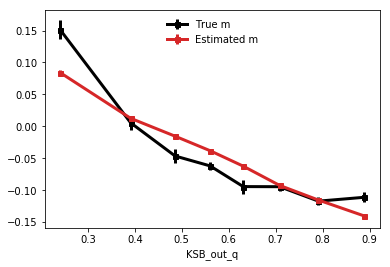

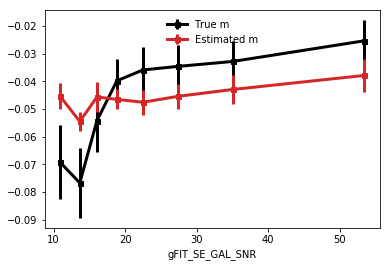

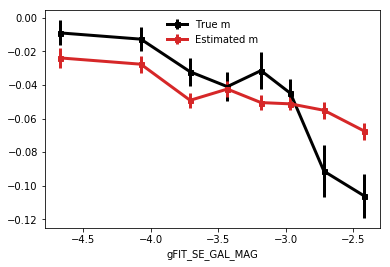

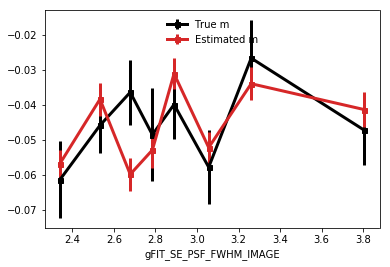

calculating gFIT_final_e1 gFIT_final_e2


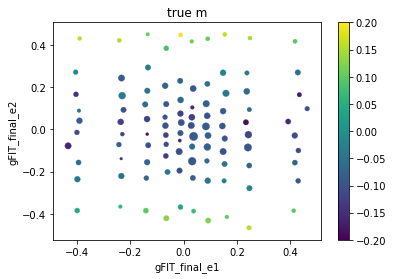

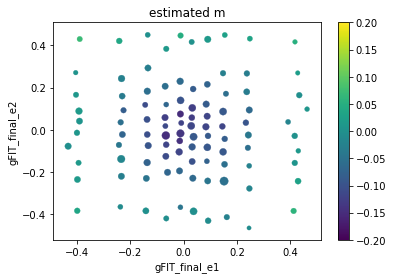

Chi^2 = 0.004865288009750884


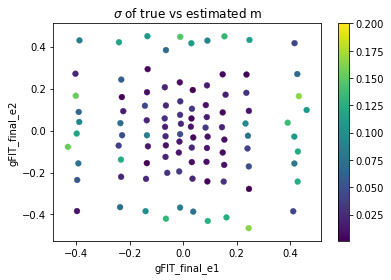

calculating KSB_final_e1 KSB_final_e2


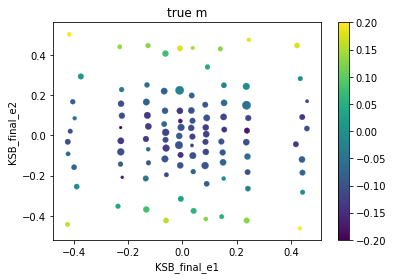

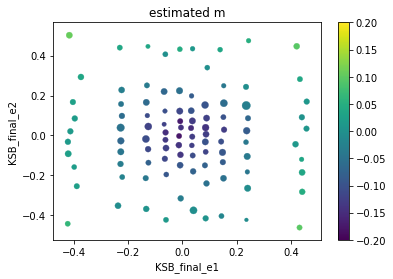

Chi^2 = 0.004874221006200881


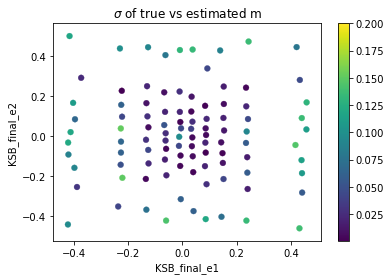

calculating g1_intrinsic g2_intrinsic


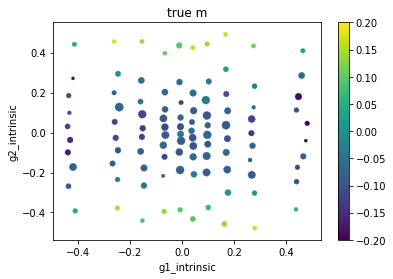

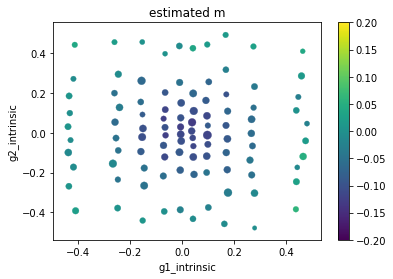

Chi^2 = 0.006260448625194945


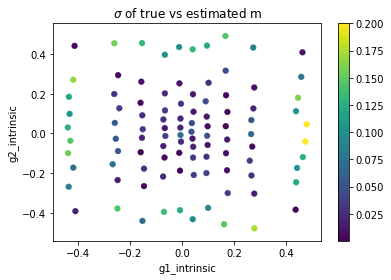

calculating gFIT_out_beta gFIT_out_q


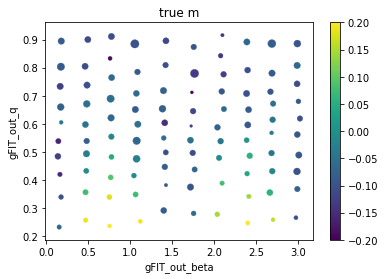

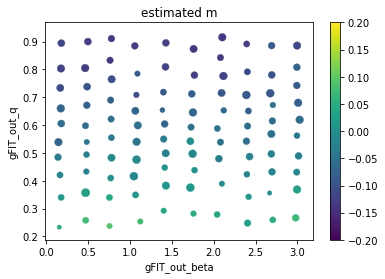

Chi^2 = 0.0057942354560455685


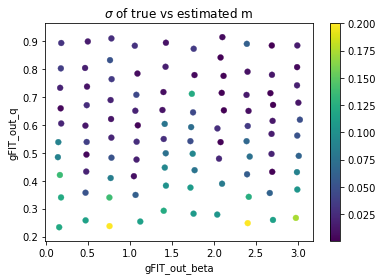

calculating KSB_out_beta KSB_out_q


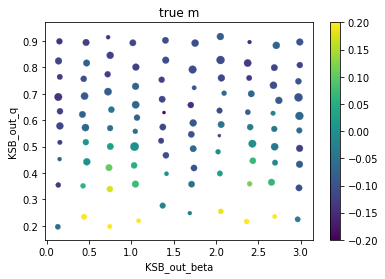

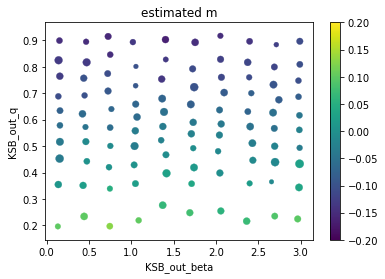

Chi^2 = 0.005893327311355133


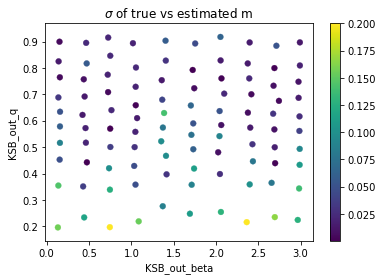

calculating in_beta in_q


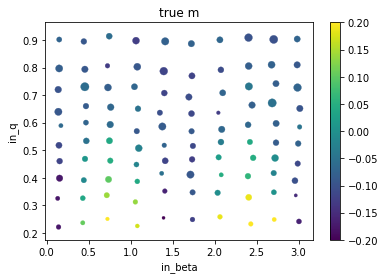

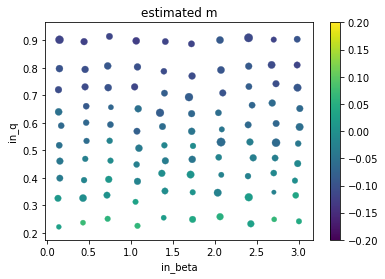

Chi^2 = 0.007420262935483462


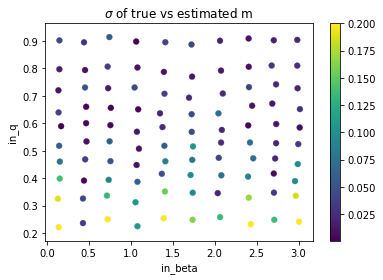

calculating bulge_hlr disk_hlr


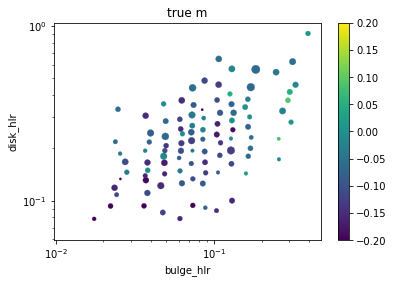

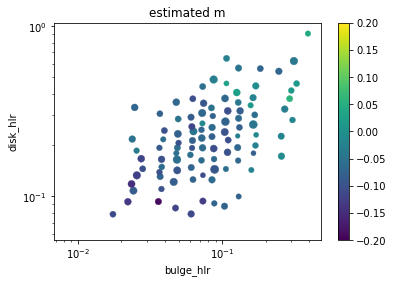

Chi^2 = 0.003872926399565748


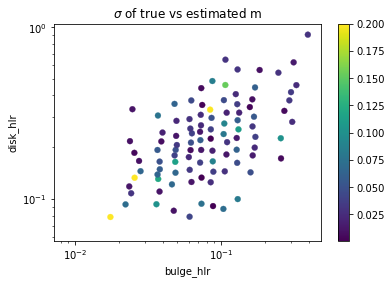

calculating bulge_flux disk_flux


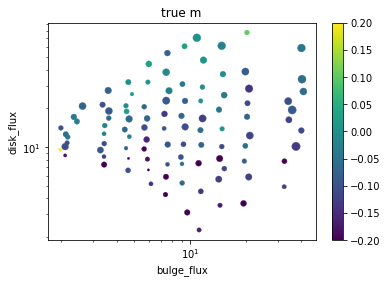

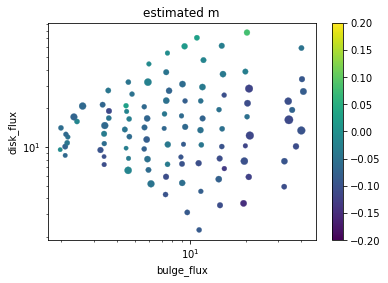

Chi^2 = 0.005609187900366499


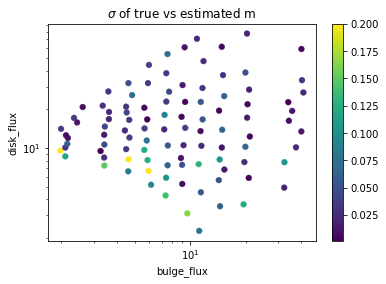

calculating KSB_out_sn gFIT_out_flux


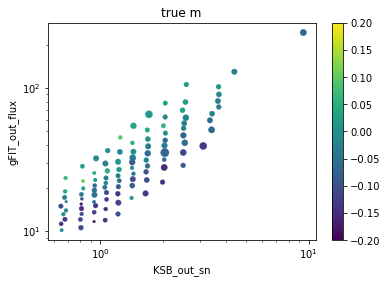

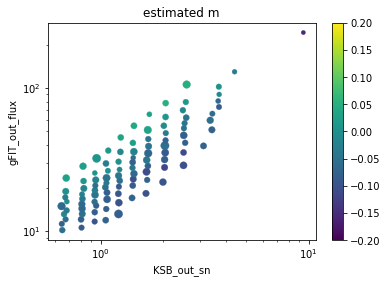

Chi^2 = 0.0016472394424995377


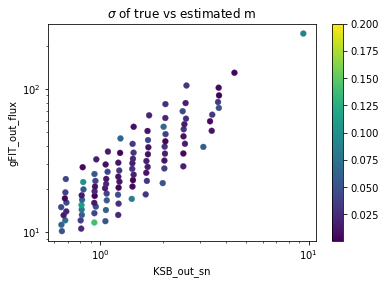

calculating bulge_hlr bulge_n


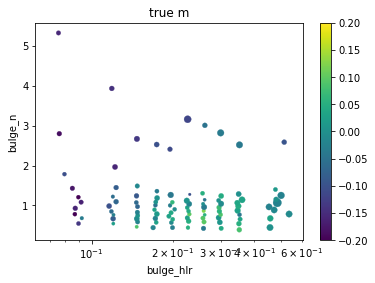

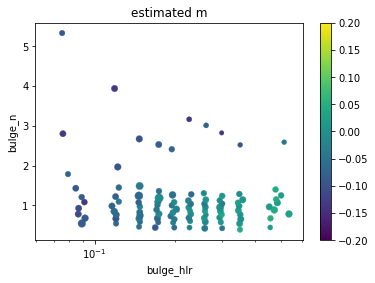

Chi^2 = 0.0027885664758934676


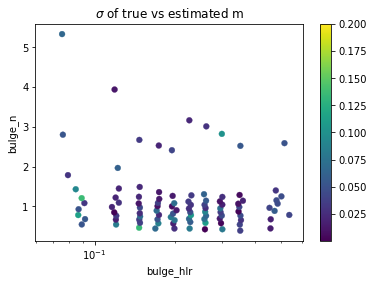

In [35]:
run nnsc.py n_epochs 600 lr_decay 300 learning_rate 0.02

#### extra_filter 

The parameter extra_filter can be either None, 'has_disk', 'has_no_disk' or 'sfrac#', where # is a number. 

If extra_filter is has_disk (has_no_disk), only galaxies with a disk and a bulge (a single Sersic bulge) are used in the training and test sets. 

If 'sfrac#' is set, wherr # is a number between 0 and 100, it selects for both the test and training sets a population with # percent of galaxies with a single Sersic profile. This has been used to generate the models shown in Fig. 9 from Pujol et al (2020).

Example:

Here we run the training for a population of 10 percent single Sersic profile

In [37]:
reload(param)

<module 'config.param' from '/Users/arnau/Documents/physics/codes/nnsc/config/param.pyc'>


            _  _
          /u@)(@\        running bias_ldae.py
     nn      Y
     ' Y_____H____
      \ V  |-['']-|___,,
       \ \ |T'T' T|___nn
       |   || |  ||   UU
       /``\WALL.E `\
      / /A \   / A  \
      L____J   L____J
    
Learn the network



Fully supervised learning



| Mean Sq error |   Epoch  |
|---------------|----------|
|     0.913946  |    0   |
|     0.897303  |    1   |
|     0.881271  |    2   |
|     0.866836  |    3   |
|     0.853785  |    4   |
|     0.841850  |    5   |
|     0.830746  |    6   |
|     0.820102  |    7   |
|     0.809599  |    8   |
|     0.799062  |    9   |
|     0.788388  |    10   |
|     0.777511  |    11   |
|     0.766212  |    12   |
|     0.751923  |    13   |
|     0.725083  |    14   |
|     0.698997  |    15   |
|     0.672945  |    16   |
|     0.639672  |    17   |
|     0.603280  |    18   |
|     0.570358  |    19   |
|     0.539274  |    20   |
|     0.508734  |    21   |
|     0.476965  |    22   |
|     0.442973 

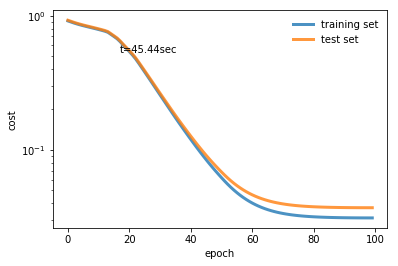

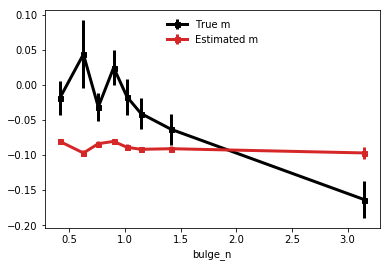

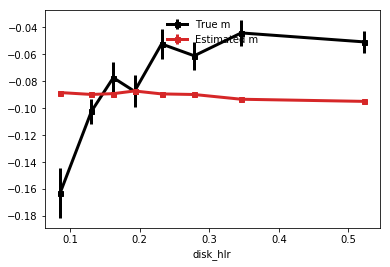

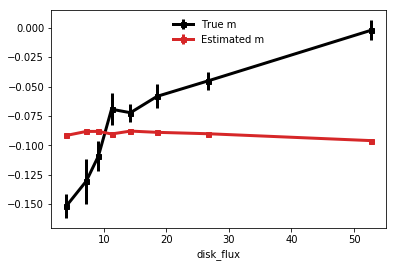

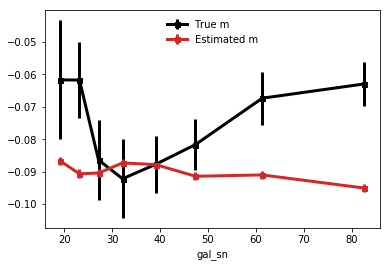

...

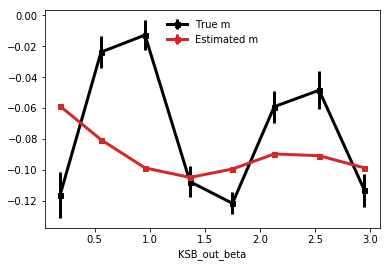

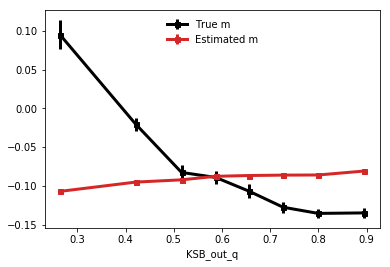

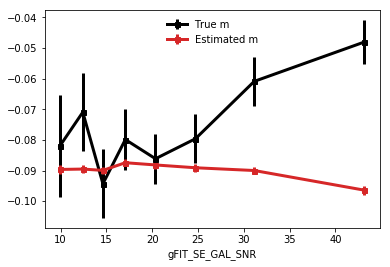

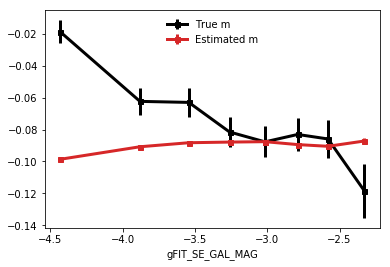

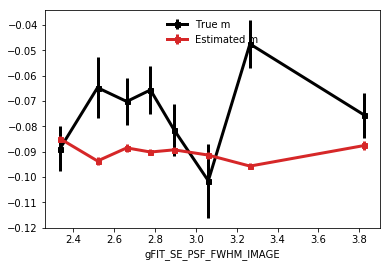

calculating gFIT_final_e1 gFIT_final_e2


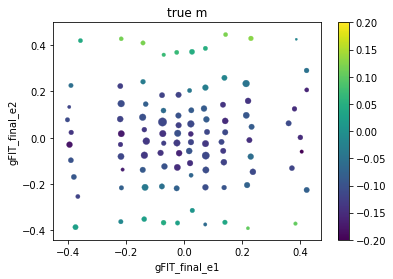

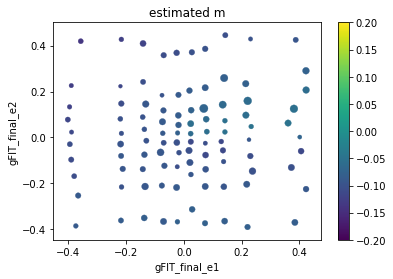

Chi^2 = 0.006628267579976579


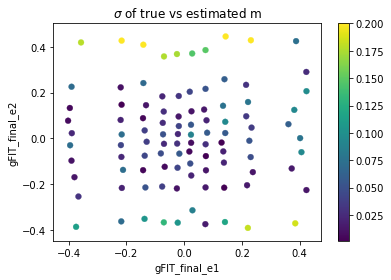

calculating KSB_final_e1 KSB_final_e2


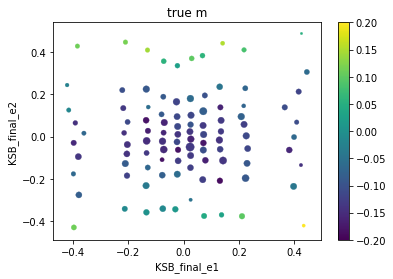

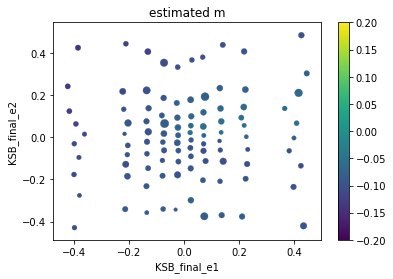

Chi^2 = 0.00846836188714917


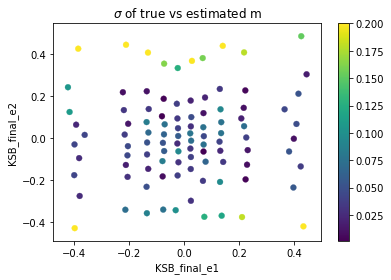

calculating g1_intrinsic g2_intrinsic


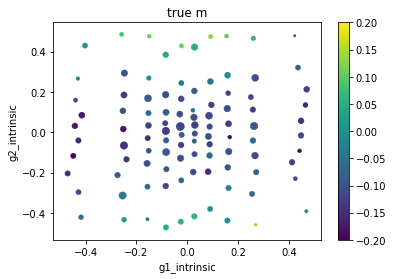

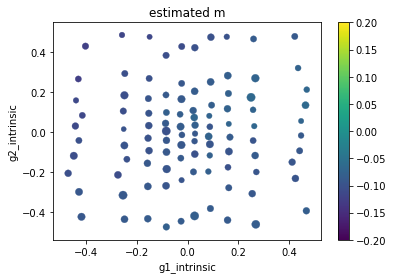

Chi^2 = 0.006254745873410746


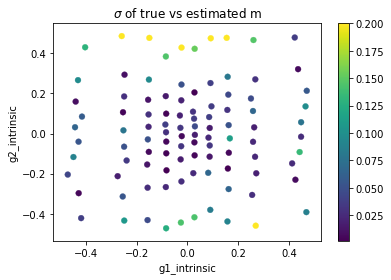

calculating gFIT_out_beta gFIT_out_q


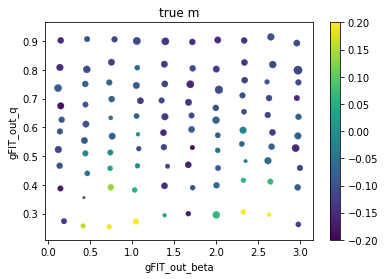

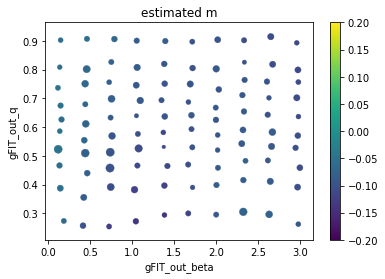

Chi^2 = 0.00903206746270126


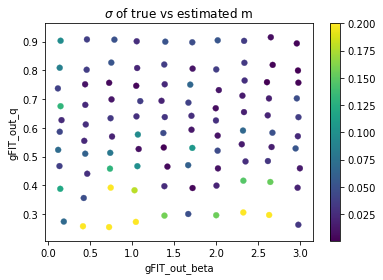

calculating KSB_out_beta KSB_out_q


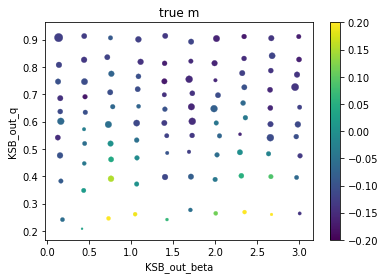

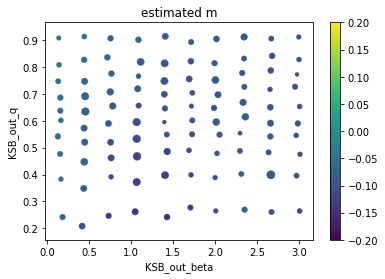

Chi^2 = 0.010965923848224259


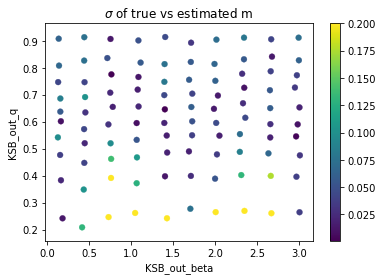

calculating in_beta in_q


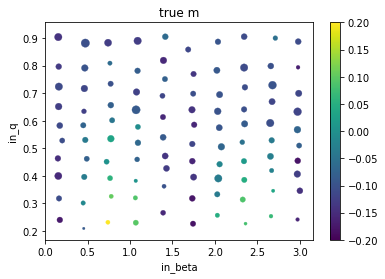

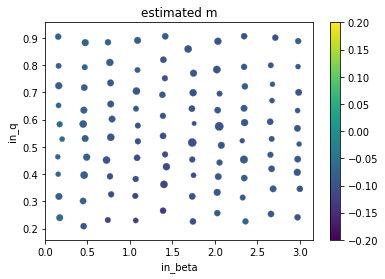

Chi^2 = 0.006621620559997876


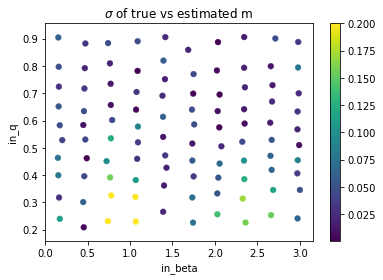

calculating bulge_hlr disk_hlr


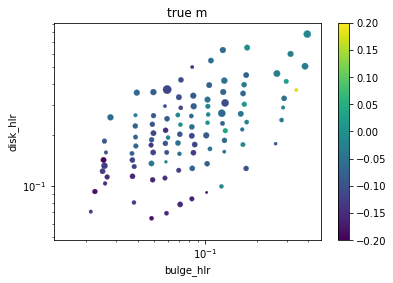

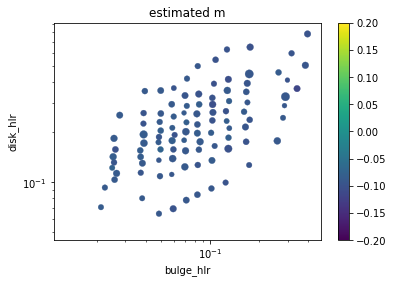

Chi^2 = 0.004171936256638128


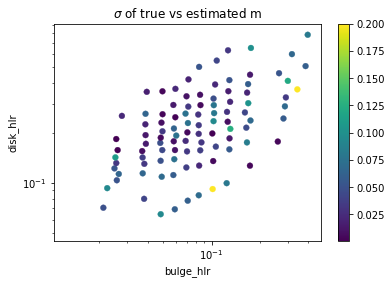

calculating bulge_flux disk_flux


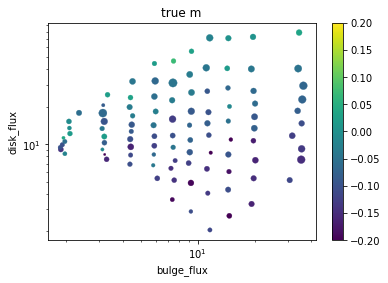

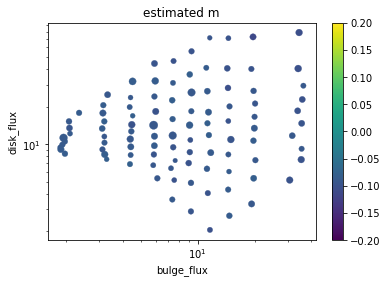

Chi^2 = 0.004206688486742919


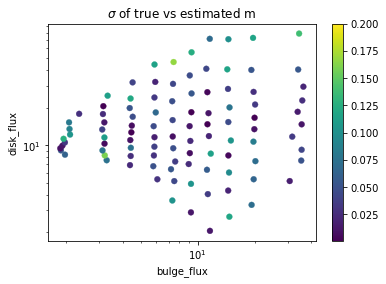

calculating KSB_out_sn gFIT_out_flux


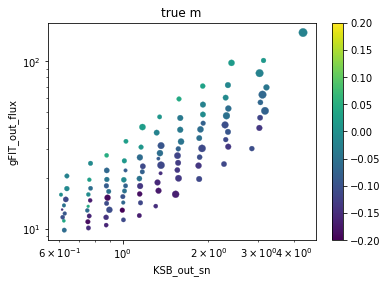

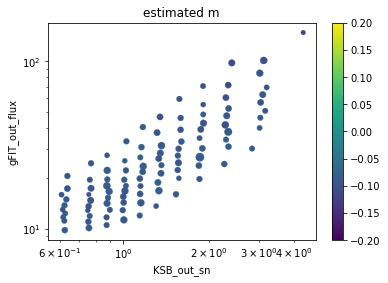

Chi^2 = 0.00428541370065307


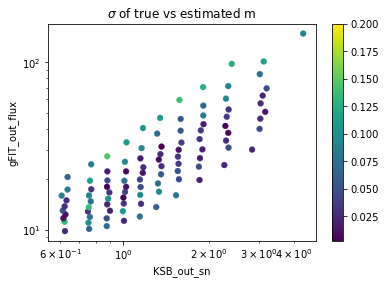

calculating bulge_hlr bulge_n


/Users/arnau/env/tf/lib/python2.7/site-packages/numpy/core/fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/arnau/env/tf/lib/python2.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/Users/arnau/env/tf/lib/python2.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


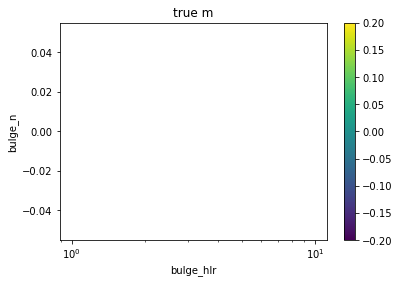

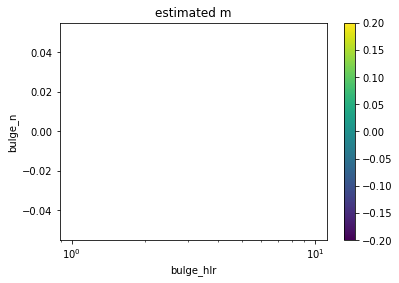

Chi^2 = nan


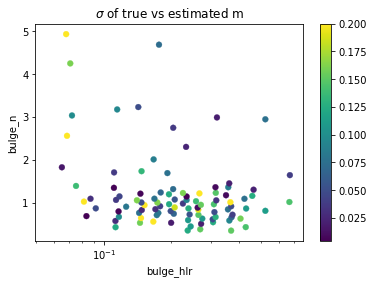

In [38]:
run nnsc.py extra_filter sfrac10